# Licence Data for Land Surveyors, Civil Engineers, Geotechincal Engineers, Structural Engineers, Traffic Engineers and Dual Licences (Civil & Land Surveyor)

## Admin Work - Imports and Such
---

In [1]:
#Imports
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import geopandas as gpd
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from datetime import datetime, timedelta
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [2]:
#Check Encodings - Not used unless data changes

# # Try different encodings (e.g., 'utf-8', 'latin-1', 'ISO-8859-1') until you find the correct one
# encodings = ['utf-8', 'latin-1', 'ISO-8859-1']

# for encoding in encodings:
#     try:
#         df_raw = pd.read_csv('ProfEngrsLandSurvyrsGeologist_Data.csv', encoding=encoding)
#         print(f"File read successfully with encoding: {encoding}")
#         break
#     except UnicodeDecodeError:
#         print(f"Error decoding with encoding: {encoding}. Trying the next one.")

# # If none of the encodings work, you might need to investigate the file and its actual encoding.


In [3]:
#Read in Licence Data
df_raw = pd.read_csv('ProfEngrsLandSurvyrsGeologist_Data.csv', encoding= 'latin-1')

C:\Users\James\AppData\Local\Temp\ipykernel_21904\3749519479.py:2: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  df_raw = pd.read_csv('ProfEngrsLandSurvyrsGeologist_Data.csv', encoding= 'latin-1')


In [4]:
#Remove Unused Columns

df_raw = df_raw[[#'Agency Name', 
    'License Type', 
    # 'Speciality Code', 
    'License Number',
    # 'Indiv/Org', 
    'Org/Last Name', 'First Name', 'Middle Name', 'Suffix',
    'Address Line 1', 'Address Line 2', 'City', 'County', 'State', 
    #'Zip',
       #'Country', 
       'Original Issue Date', 
       'Expiration Date', 
    #    'School', 'Year Graduated', 'Degree', 
    'License Status']]

In [5]:
#Make all indvidual Dataframes

df_raw_civil = df_raw[df_raw['License Type'] == 'Civil Engineer']
df_raw_ls = df_raw[df_raw['License Type'] == 'Land Surveyor']
df_raw_civil = df_raw_civil[df_raw_civil['License Status'] == 'Active']
df_raw_ls = df_raw_ls[df_raw_ls['License Status'] == 'Active']
df_dual = (df_raw_civil.merge(df_raw_ls, on=["Org/Last Name","First Name", "Middle Name","Suffix"], how="inner",))
df_dual['Original Issue Date_x'] = df_dual['Original Issue Date_x'].astype('datetime64[ns]')
df_dual['Original Issue Date_y'] = df_dual['Original Issue Date_y'].astype('datetime64[ns]')
df_dual['Date_of_Dual'] = df_dual.apply(lambda row: max(row['Original Issue Date_x'], row['Original Issue Date_y']), axis=1)

df_raw_Geo_Engineer = df_raw[df_raw['License Type'] == 'Geotechnical Engineer']
df_raw_structural = df_raw[df_raw['License Type'] == 'Structural Engineer']
df_raw_Traffic = df_raw[df_raw['License Type'] == 'Traffic Engineers']
df_raw_Geo_Engineer = df_raw_Geo_Engineer[df_raw_Geo_Engineer['License Status'] == 'Active']
df_raw_structural = df_raw_structural[df_raw_structural['License Status'] == 'Active']
df_raw_Traffic = df_raw_Traffic[df_raw_Traffic['License Status'] == 'Active']

In [6]:
# Clean up some issues in the Dual Dataframe

# Convert 'County' column to a categorical type, and replace missing or blank values with 'out_of_state'
df_dual['County_x'] = df_dual['County_x'].astype('category').cat.add_categories(['out_of_state']).fillna('out_of_state')

# Group by county and count the number of surveyors in each county
dual_counts = df_dual['County_x'].value_counts().reset_index()
dual_counts.columns = ['County', 'Count']

# Sort the DataFrame by county names
dual_counts = dual_counts.sort_values(by='County').reset_index(drop=True)

In [7]:
# Load the shapefile for California counties
california_counties_map = gpd.read_file("CA_Counties/CA_Counties_TIGER2016.shp")

## General Data About the Licences
---

In [8]:
def calculate_average_license_age(df, date_column='Original Issue Date'):
    # Convert 'Original Issue Date' to datetime
    df[date_column] = pd.to_datetime(df[date_column], errors='coerce')

    # Calculate the difference between today and the 'Original Issue Date' to get the age of licensure
    df['License Age'] = (datetime.now() - df[date_column]).dt.days

    # Convert days to years
    days_in_year = 365.25  # Accounting for leap years
    df['License Age'] = df['License Age'] / days_in_year

    # Calculate the average license age for the entire DataFrame
    average_license_age = df['License Age'].mean()

    return average_license_age


In [9]:
# Execute Average Licence Ages
civil_average_age = calculate_average_license_age(df_raw_civil)
print(f'Average License Age for Civils: {civil_average_age:.2f} years')
ls_average_age = calculate_average_license_age(df_raw_ls)
print(f'Average License Age for Surveyors: {ls_average_age:.2f} years')
dual_average_age = calculate_average_license_age(df_dual, date_column='Date_of_Dual')
print(f'Average License Age for Duals: {dual_average_age:.2f} years')
geo_average_age = calculate_average_license_age(df_raw_Geo_Engineer)
print(f'Average License Age for Geotechs: {geo_average_age:.2f} years')
structural_average_age = calculate_average_license_age(df_raw_structural)
print(f'Average License Age for Geotechs: {structural_average_age:.2f} years')
traffic_average_age = calculate_average_license_age(df_raw_Traffic)
print(f'Average License Age for Geotechs: {traffic_average_age:.2f} years')

Average License Age for Civils: 21.95 years
Average License Age for Surveyors: 23.03 years
Average License Age for Duals: 21.75 years
Average License Age for Geotechs: 22.19 years
Average License Age for Geotechs: 20.27 years
Average License Age for Geotechs: 21.28 years


In [10]:
df_raw_ls.describe()

,License Number,Original Issue Date,License Age
count,3852.000000,3851,3851.000000
mean,7522.536345,2000-12-05 02:42:39.542975872,23.030492
min,3140.000000,1961-12-20 00:00:00,0.068446
25%,6345.750000,1990-06-15 00:00:00,12.424367
50%,7812.500000,2001-07-27 00:00:00,22.390144
75%,8855.250000,2011-07-15 00:00:00,33.505818
max,9843.000000,2023-11-22 00:00:00,61.990418
std,1600.808511,NaN,13.506771


In [11]:
df_raw_civil.describe()

,License Number,Original Issue Date,License Age
count,57127.000000,57093,57093.000000
mean,63881.298773,2002-01-03 02:04:53.962482304,21.951850
min,8272.000000,1951-11-08 00:00:00,0.082136
25%,48643.500000,1991-12-20 00:00:00,10.551677
50%,65728.000000,2003-06-27 00:00:00,20.473648
75%,81098.500000,2013-05-29 00:00:00,31.991786
max,95763.000000,2023-11-17 00:00:00,72.106776
std,20332.920215,NaN,13.766409


In [12]:
df_dual.describe()

,License Number_x,Original Issue Date_x,License Number_y,Original Issue Date_y,Date_of_Dual,License Age
count,667.000000,666,667.000000,667,666,666.000000
mean,54327.506747,1995-10-05 16:08:38.918918912,7612.502249,2001-05-27 19:38:46.236881664,2002-03-18 11:01:37.297297280,21.748229
min,19660.000000,1970-08-19 00:00:00,3140.000000,1961-12-20 00:00:00,1972-06-19 00:00:00,0.068446
25%,42463.000000,1987-08-21 00:00:00,6878.000000,1992-06-26 00:00:00,1994-02-04 00:00:00,13.210130
50%,52962.000000,1994-09-12 12:00:00,7810.000000,2001-07-27 00:00:00,2002-12-19 12:00:00,20.992471
75%,64321.000000,2003-01-23 00:00:00,8764.000000,2010-07-16 00:00:00,2010-10-01 00:00:00,29.864476
max,95030.000000,2023-04-21 00:00:00,9840.000000,2023-11-22 00:00:00,2023-11-22 00:00:00,51.493498
std,15741.313852,NaN,1456.892712,NaN,NaN,11.918993


In [13]:
df_raw_Geo_Engineer.describe()

,License Number,Original Issue Date,License Age
count,1297.000000,1296,1296.000000
mean,2254.597533,2001-10-09 08:27:46.666666752,22.186577
min,94.000000,1987-09-09 00:00:00,0.963723
25%,2119.000000,1989-07-14 00:00:00,12.941821
50%,2561.000000,2002-01-25 00:00:00,21.891855
75%,2899.000000,2011-01-07 00:00:00,34.425736
max,3227.000000,2022-12-30 00:00:00,36.271047
std,905.123551,NaN,11.022568


In [14]:
df_raw_structural.describe()

,License Number,Original Issue Date,License Age
count,4468.000000,4464,4464.000000
mean,4843.810206,2003-09-07 15:08:23.225806464,20.274796
min,504.000000,1942-02-04 00:00:00,0.120465
25%,3651.750000,1993-01-29 00:00:00,9.347023
50%,4976.500000,2006-05-11 00:00:00,17.601643
75%,6120.250000,2014-08-12 00:00:00,30.880219
max,7242.000000,2023-11-03 00:00:00,81.864476
std,1501.991739,NaN,13.544989


In [15]:
df_raw_Traffic.describe()

,License Number,Original Issue Date,License Age
count,1458.000000,1454,1454.000000
mean,2130.166667,2002-09-04 11:35:14.442916224,21.282730
min,2.000000,1975-05-14 00:00:00,0.906229
25%,1736.250000,1993-01-14 00:00:00,10.986995
50%,2255.000000,2004-01-30 00:00:00,19.879535
75%,2659.750000,2012-12-21 00:00:00,30.921287
max,3032.000000,2023-01-20 00:00:00,48.594114
std,669.255477,NaN,12.804242


## Historical Licence Plots
---

In [16]:
def plot_licenses_per_year_with_moving_average(df, nameword, date_column='Original Issue Date', window=10):
    # Convert 'Original Issue Date' to datetime
    df[date_column] = pd.to_datetime(df[date_column], errors='coerce')

    # Extract the year from the 'Original Issue Date'
    df['Year'] = df[date_column].dt.year

    # Count the occurrences of each year
    licenses_per_year = df['Year'].value_counts().reset_index()
    licenses_per_year.columns = ['Year', 'Number of Licenses Issued']

    # Sort the DataFrame by year
    licenses_per_year = licenses_per_year.sort_values(by='Year').reset_index(drop=True)

    # Calculate the moving average
    licenses_per_year['Moving Average'] = licenses_per_year['Number of Licenses Issued'].rolling(window=window, min_periods=1).mean()

    # Plot the data
    plt.plot(licenses_per_year['Year'], licenses_per_year['Number of Licenses Issued'], marker='o', label='Number of Licenses Issued')
    plt.plot(licenses_per_year['Year'], licenses_per_year['Moving Average'], 'r--', label=f'Moving Average ({window}-period)')

    plt.title(f'Number of {nameword} Licenses Issued Each Year')
    plt.xlabel('Year')
    plt.ylabel('Number of Licenses Issued')
    plt.legend()
    plt.grid(True)
    plt.show()

In [17]:
# Make Dataframes with delinquents
df_raw_civil_with_delinquents = df_raw[df_raw['License Type'] == 'Civil Engineer']
df_raw_ls_with_delinquents = df_raw[df_raw['License Type'] == 'Land Surveyor']
df_raw_Geo_Engineer_with_delinquents = df_raw[df_raw['License Type'] == 'Geotechnical Engineer']
df_raw_structural_with_delinquents = df_raw[df_raw['License Type'] == 'Structural Engineer']
df_raw_Traffic_with_delinquents = df_raw[df_raw['License Type'] == 'Traffic Engineers']
df_dual_with_delinquents = (df_raw_civil_with_delinquents.merge(df_raw_ls_with_delinquents, on=["Org/Last Name","First Name", "Middle Name","Suffix"], how="inner",))
df_dual_with_delinquents['Original Issue Date_x'] = df_dual_with_delinquents['Original Issue Date_x'].astype('datetime64[ns]')
df_dual_with_delinquents['Original Issue Date_y'] = df_dual_with_delinquents['Original Issue Date_y'].astype('datetime64[ns]')
df_dual_with_delinquents['Date_of_Dual'] = df_dual_with_delinquents.apply(lambda row: max(row['Original Issue Date_x'], row['Original Issue Date_y']), axis=1)

C:\Users\James\AppData\Local\Temp\ipykernel_21904\2155052854.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[date_column] = pd.to_datetime(df[date_column], errors='coerce')
C:\Users\James\AppData\Local\Temp\ipykernel_21904\2155052854.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = df[date_column].dt.year


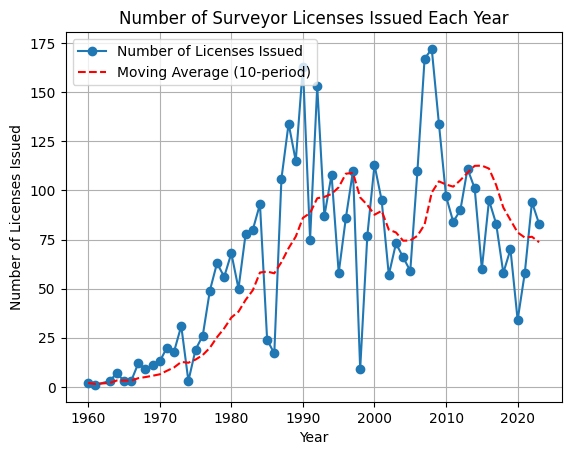

C:\Users\James\AppData\Local\Temp\ipykernel_21904\2155052854.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[date_column] = pd.to_datetime(df[date_column], errors='coerce')
C:\Users\James\AppData\Local\Temp\ipykernel_21904\2155052854.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = df[date_column].dt.year


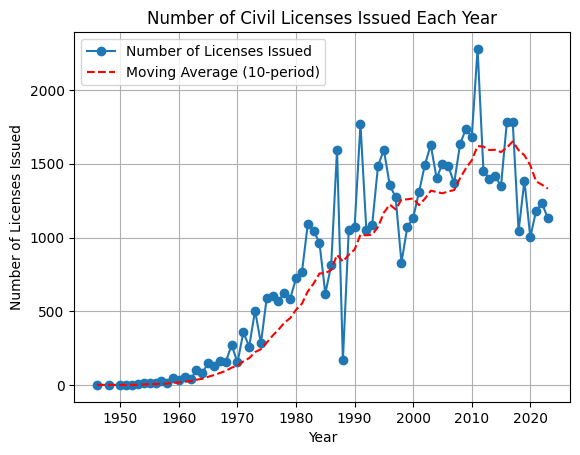

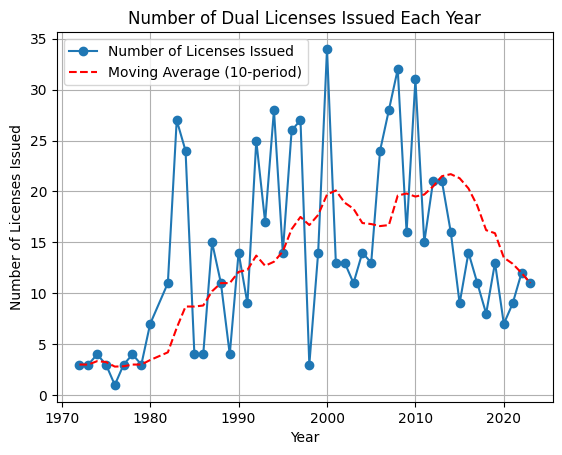

C:\Users\James\AppData\Local\Temp\ipykernel_21904\2155052854.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[date_column] = pd.to_datetime(df[date_column], errors='coerce')
C:\Users\James\AppData\Local\Temp\ipykernel_21904\2155052854.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = df[date_column].dt.year


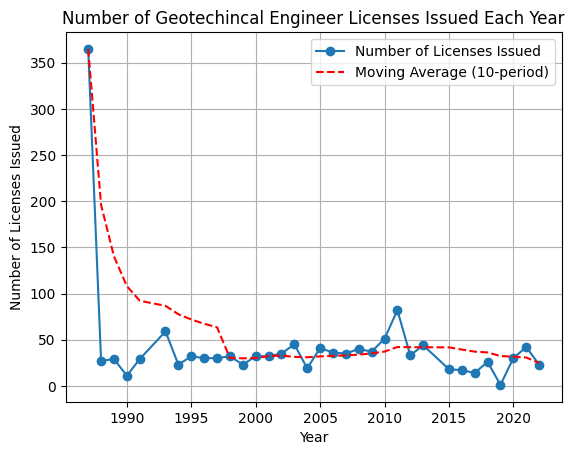

C:\Users\James\AppData\Local\Temp\ipykernel_21904\2155052854.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[date_column] = pd.to_datetime(df[date_column], errors='coerce')
C:\Users\James\AppData\Local\Temp\ipykernel_21904\2155052854.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = df[date_column].dt.year


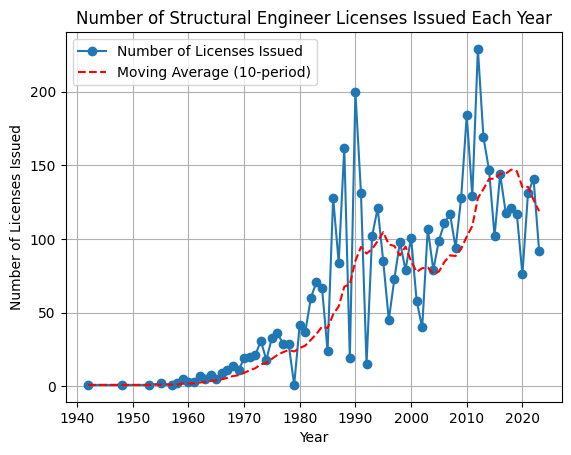

C:\Users\James\AppData\Local\Temp\ipykernel_21904\2155052854.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[date_column] = pd.to_datetime(df[date_column], errors='coerce')
C:\Users\James\AppData\Local\Temp\ipykernel_21904\2155052854.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = df[date_column].dt.year


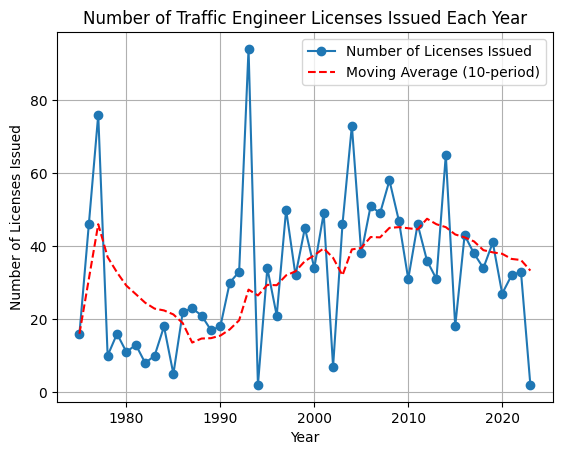

In [18]:
plot_licenses_per_year_with_moving_average(df_raw_ls_with_delinquents, "Surveyor")
plot_licenses_per_year_with_moving_average(df_raw_civil_with_delinquents, "Civil")
plot_licenses_per_year_with_moving_average(df_dual_with_delinquents,"Dual", date_column='Date_of_Dual')
plot_licenses_per_year_with_moving_average(df_raw_Geo_Engineer_with_delinquents, "Geotechincal Engineer")
plot_licenses_per_year_with_moving_average(df_raw_structural_with_delinquents, "Structural Engineer")
plot_licenses_per_year_with_moving_average(df_raw_Traffic_with_delinquents, "Traffic Engineer")

## New Dual Licences Vs Civils & Surveyors
---

In [19]:
def plot_dual_licenses_per_year_against_other_licences(df_dual, df_compare, nameword, date_column='Original Issue Date', window=10):
    # Convert 'Original Issue Date' to datetime
    df_dual[date_column] = pd.to_datetime(df_dual['Date_of_Dual'], errors='coerce')

    # Extract the year from the 'Original Issue Date'
    df_dual['Year'] = df_dual['Date_of_Dual'].dt.year

    # Count the occurrences of each year
    dual_licenses_per_year = df_dual['Year'].value_counts().reset_index()
    dual_licenses_per_year.columns = ['Year', 'Number of Dual Licenses Issued']

    # Convert 'Original Issue Date' to datetime
    df_compare[date_column] = pd.to_datetime(df_compare[date_column], errors='coerce')

    # Extract the year from the 'Original Issue Date'
    df_compare['Year'] = df_compare[date_column].dt.year

    # Filter out years before 1980
    df_dual = df_dual[df_dual['Year'] >= 1980]
    df_compare = df_compare[df_compare['Year'] >= 1980]

    # Count the occurrences of each year
    compare_licenses_per_year = df_compare['Year'].value_counts().reset_index()
    compare_licenses_per_year.columns = ['Year', f'Number of {nameword}Licenses Issued']
    
    # Merge DataFrame
    merged_data = pd.merge(dual_licenses_per_year, compare_licenses_per_year, on='Year', how='left')
    
    # Create % per year column
    merged_data['Total percent'] = (merged_data['Number of Dual Licenses Issued'] / merged_data[f'Number of {nameword}Licenses Issued']) * 100
     # Handle zero values in percentage calculation
    merged_data['Total percent'] = merged_data.apply(
        lambda row: (row['Number of Dual Licenses Issued'] / row[f'Number of {nameword}Licenses Issued']) * 100 
        if row[f'Number of {nameword}Licenses Issued'] != 0 else 0, 
        axis=1
    )
    # Drop unused columns
    # merged_data = merged_data.drop(columns=['Number of Dual Licenses Issued', f'Number of {nameword}Licenses Issued'])

    # Sort the DataFrame by year
    merged_data = merged_data.sort_values(by='Year').reset_index(drop=True)

    # Calculate the moving average
    merged_data['Moving Average'] = merged_data['Total percent'].rolling(window=window, min_periods=1).mean()

    # Plot the data
    plt.plot(merged_data['Year'], merged_data['Total percent'], marker='o', label='Total percent')
    plt.plot(merged_data['Year'], merged_data['Moving Average'], 'r--', label=f'Moving Average ({window}-period)')

    plt.title(f'Percent of Dual Licenses Issued Each Year compared to {nameword}')
    plt.xlabel('Year')
    plt.ylabel(f'% Dual Licenses Issued compared with {nameword}')
    plt.legend()
    plt.grid(True)
    plt.show()

C:\Users\James\AppData\Local\Temp\ipykernel_21904\1281667868.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_compare[date_column] = pd.to_datetime(df_compare[date_column], errors='coerce')
C:\Users\James\AppData\Local\Temp\ipykernel_21904\1281667868.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_compare['Year'] = df_compare[date_column].dt.year


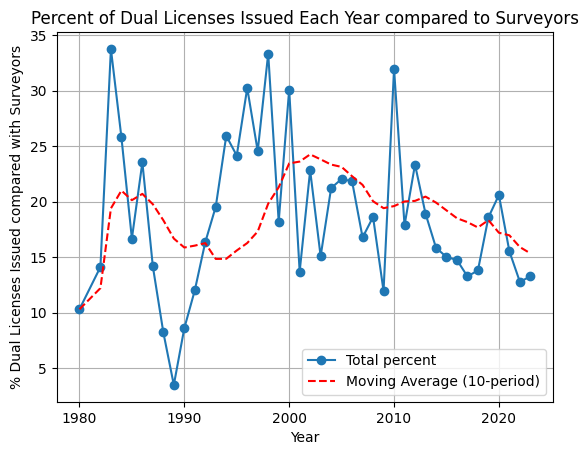

C:\Users\James\AppData\Local\Temp\ipykernel_21904\1281667868.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_compare[date_column] = pd.to_datetime(df_compare[date_column], errors='coerce')
C:\Users\James\AppData\Local\Temp\ipykernel_21904\1281667868.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_compare['Year'] = df_compare[date_column].dt.year


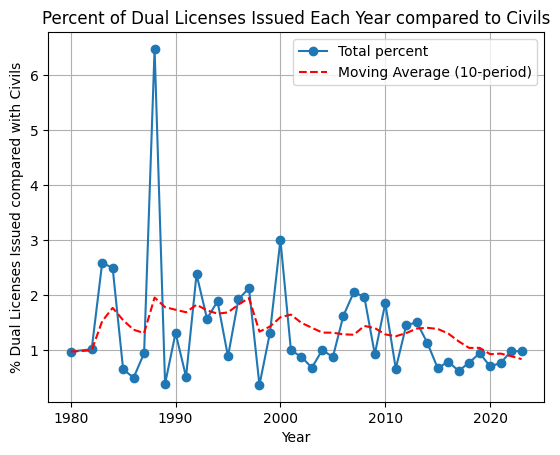

In [20]:
plot_dual_licenses_per_year_against_other_licences(df_dual_with_delinquents, df_raw_ls_with_delinquents, "Surveyors")
plot_dual_licenses_per_year_against_other_licences(df_dual_with_delinquents, df_raw_civil_with_delinquents, "Civils")

## Show Maps of Counts of Each License
---

In [21]:
def process_counts(df):
    # Convert 'County' column to a categorical type, and replace missing or blank values with 'out_of_state'
    df['County'] = df['County'].astype('category').cat.add_categories(['out_of_state']).fillna('out_of_state')

    # Group by county and count the number of surveyors in each county
    county_counts = df['County'].value_counts().reset_index()
    county_counts.columns = ['County', 'Count']

    # Sort the DataFrame by county names
    county_counts = county_counts.sort_values(by='County').reset_index(drop=True)

    return county_counts

In [22]:
#Run Process Counts in the Dataframes
county_surveyor_counts = process_counts(df_raw_ls)
# county_surveyor_counts.to_csv("countysurveyorcounts.csv")
county_civil_counts = process_counts(df_raw_civil)
county_geo_counts = process_counts(df_raw_Geo_Engineer)
county_structural_counts = process_counts(df_raw_structural)
county_traffic_counts = process_counts(df_raw_Traffic)

In [23]:
def plot_count_map(geo_df, count_df, count_word, geo_column='NAME', count_column='County'):
    # Merge the surveyor counts DataFrame with the geographical data
    merged_data = geo_df.merge(count_df, left_on=geo_column, right_on=count_column)

    # print("Merged Data:\n", merged_data)  # Debug print

    if merged_data.empty:
        print("No data available for", count_word, "Count.")
        return
    # Sort the DataFrame by 'Surveyor Count' in descending order
    merged_data = merged_data.sort_values(by='Count', ascending=False)

    # Create a figure with two subplots (one for the map and one for the table)
    fig, (ax_map, ax_table) = plt.subplots(1, 2, figsize=(18, 10), gridspec_kw={'width_ratios': [3, 1]})
    
    cmap = "YlOrRd"  

    # Plot the background GeoDataFrame in grayscale
    geo_df.plot(ax=ax_map, color='gray', edgecolor='black')
    
    # Plot the map
    divider = make_axes_locatable(ax_map)
    cax = divider.append_axes("right", size="5%", pad=0.1)
    merged_data.plot(column='Count', cmap=cmap, linewidth=0.8, ax=ax_map, edgecolor='0.8', legend=True, cax=cax)

    # Add annotations with surveyor counts
    for x, y, label in zip(merged_data.geometry.centroid.x, merged_data.geometry.centroid.y, merged_data['Count']):
        ax_map.text(x, y, f'{label}', fontsize=9, ha='center', color='black')

    # Create a table for the legend
    legend_table = ax_table.table(cellText=merged_data[['NAME', 'Count']].values,
                                colLabels=['County', count_word],
                                cellLoc='center', loc='center', bbox=[0, 0, 1, 1])

    # Style the table
    legend_table.auto_set_font_size(False)
    legend_table.set_fontsize(10)

    # Add labels and title
    ax_map.set_title(f'{count_word} Count by County in California', fontdict={'fontsize': 15, 'fontweight': 'bold'})
    ax_map.set_axis_off()

    # Remove axes for the table subplot
    ax_table.axis('off')

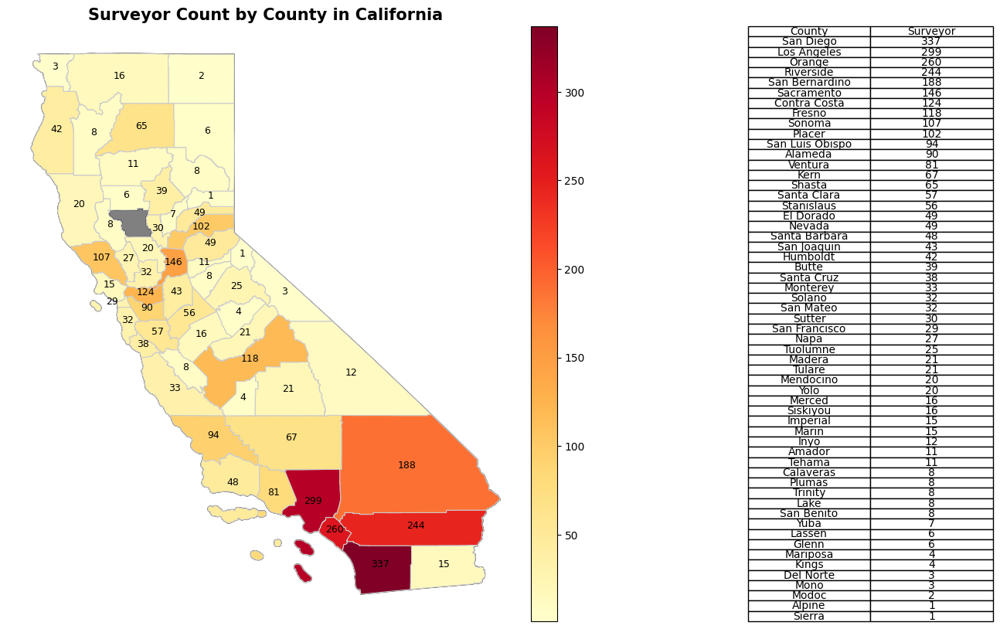

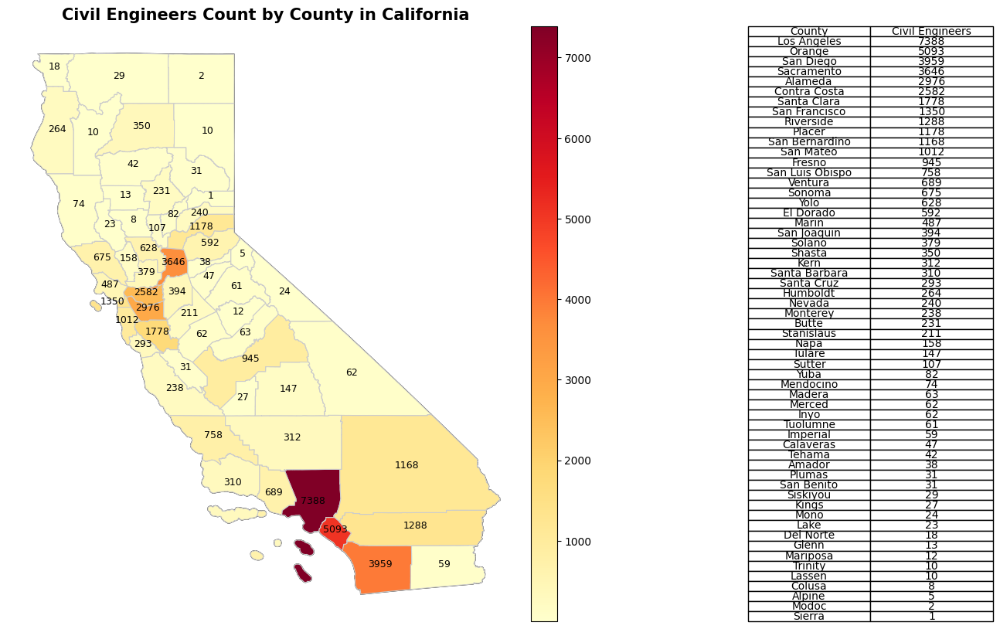

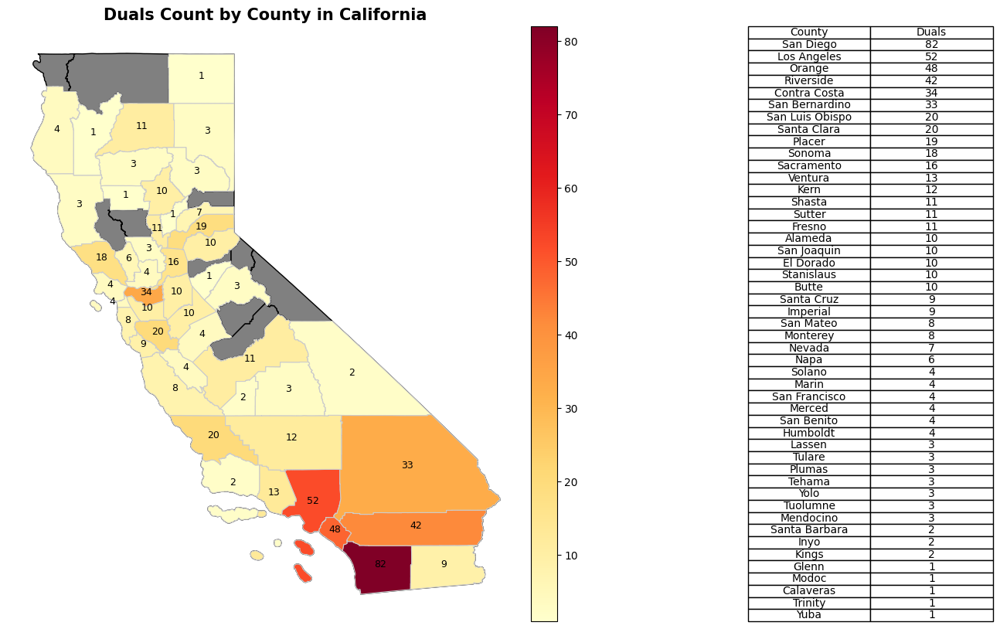

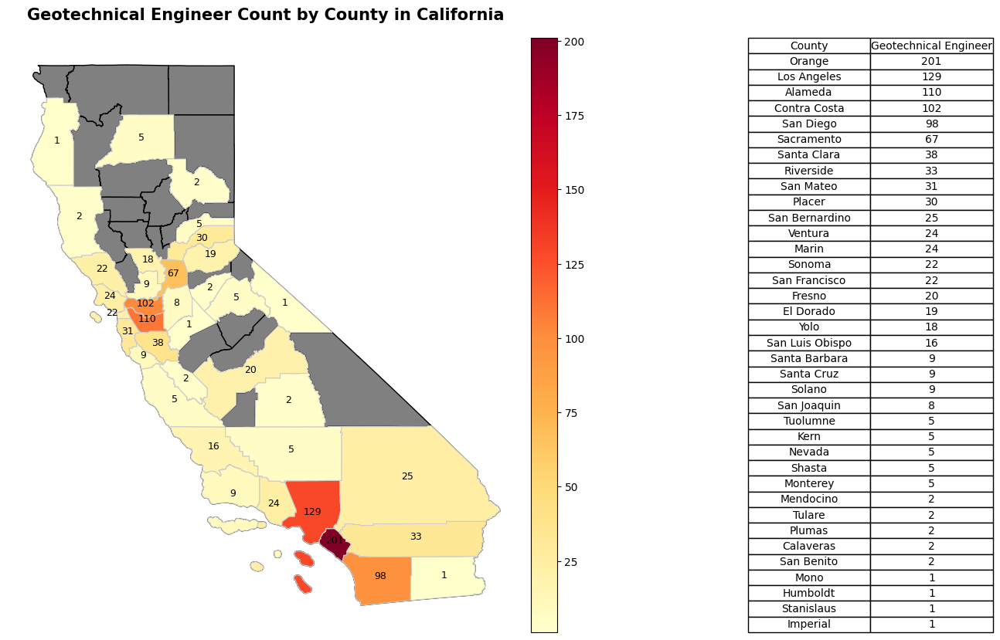

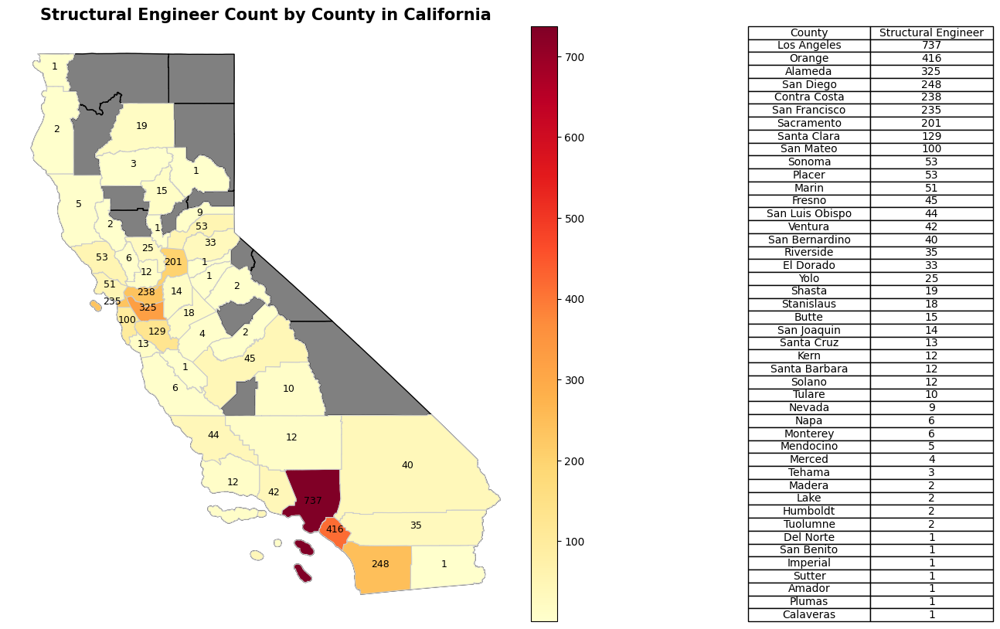

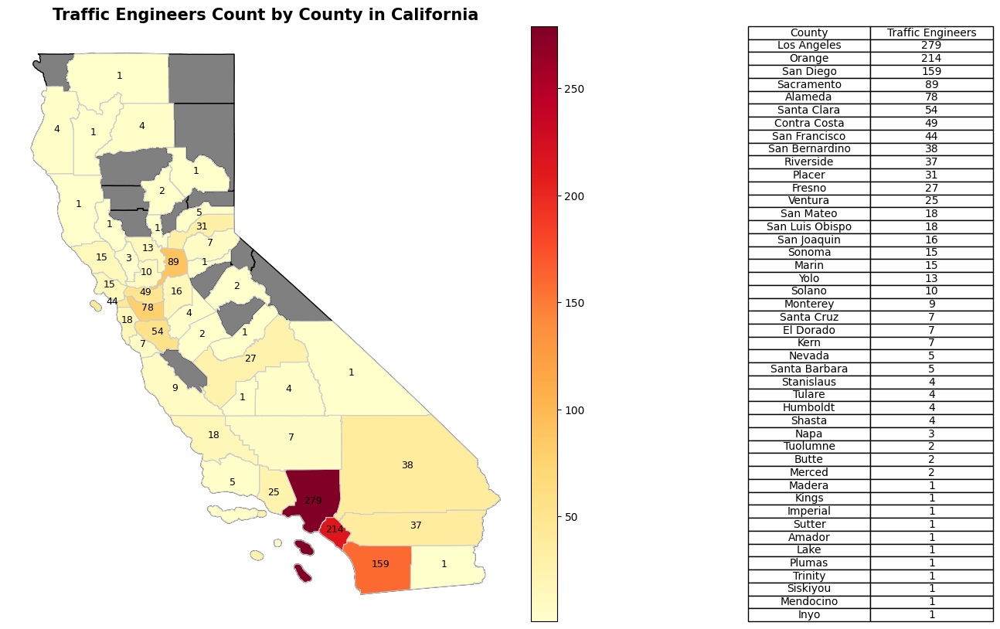

In [24]:
#plot
plot_count_map(california_counties_map, county_surveyor_counts, 'Surveyor')
plot_count_map(california_counties_map, county_civil_counts, 'Civil Engineers')
plot_count_map(california_counties_map, dual_counts, 'Duals')
plot_count_map(california_counties_map, county_geo_counts, 'Geotechnical Engineer')
plot_count_map(california_counties_map, county_structural_counts, 'Structural Engineer')
plot_count_map(california_counties_map, county_traffic_counts, 'Traffic Engineers')

## Show Maps of Age of Each License
---

In [25]:
def calculate_average_license_age_by_county(df, date_column='Original Issue Date', county_column='County'):
    # Convert 'Original Issue Date' to datetime
    df[date_column] = pd.to_datetime(df[date_column], errors='coerce')

    # Calculate the difference between today and the 'Original Issue Date' to get the age of licensure
    df['License Age'] = (datetime.now() - df[date_column]).dt.days

    # Convert days to years
    days_in_year = 365.25  # Accounting for leap years
    df['License Age'] = df['License Age'] / days_in_year

    # Group by county and calculate the average license age
    average_license_age_by_county = df.groupby(county_column)['License Age'].mean().reset_index()
    
    # Round the 'Average License Age' column to two decimal places
    average_license_age_by_county['Average License Age'] = average_license_age_by_county['License Age'].round(2)
    
    # Drop the intermediate 'License Age' column
    average_license_age_by_county = average_license_age_by_county.drop(columns='License Age')

    # Sort the DataFrame by county names
    average_license_age_by_county = average_license_age_by_county.sort_values(by=county_column).reset_index(drop=True)

    return average_license_age_by_county


In [26]:
# Execute Average Age by County on all Dataframes
ls_average_license_age_by_county = calculate_average_license_age_by_county(df_raw_ls)
civil_average_license_age_by_county = calculate_average_license_age_by_county(df_raw_civil)
dual_average_license_age_by_county = calculate_average_license_age_by_county(df_dual,date_column='Date_of_Dual', county_column='County_x')
dual_average_license_age_by_county = dual_average_license_age_by_county.rename(columns={'County_x': 'County'})
geo_average_license_age_by_county = calculate_average_license_age_by_county(df_raw_Geo_Engineer)
structural_average_license_age_by_county = calculate_average_license_age_by_county(df_raw_structural)
traffic_average_license_age_by_county = calculate_average_license_age_by_county(df_raw_Traffic)

In [27]:
def plot_age_map(geo_df, count_df, age_word, geo_column='NAME', count_column='County'):
    # Merge the surveyor counts DataFrame with the geographical data
    merged_data = geo_df.merge(count_df, left_on=geo_column, right_on=count_column)

    # print("Merged Data:\n", merged_data)  # Debug print

    if merged_data.empty:
        print("No data available for", age_word, "Average License Age.")
        return
    # Sort the DataFrame by 'Surveyor Count' in descending order
    merged_data = merged_data.sort_values(by='Average License Age', ascending=False)

    # Create a figure with two subplots (one for the map and one for the table)
    fig, (ax_map, ax_table) = plt.subplots(1, 2, figsize=(18, 10), gridspec_kw={'width_ratios': [3, 1]})
    
    cmap = "YlOrRd"  

    # Plot the background GeoDataFrame in grayscale
    geo_df.plot(ax=ax_map, color='gray', edgecolor='black')
    
    # Plot the map
    divider = make_axes_locatable(ax_map)
    cax = divider.append_axes("right", size="5%", pad=0.1)
    merged_data.plot(column='Average License Age', cmap=cmap, linewidth=0.8, ax=ax_map, edgecolor='0.8', legend=True, cax=cax)

    # Add annotations with surveyor counts
    for x, y, label in zip(merged_data.geometry.centroid.x, merged_data.geometry.centroid.y, merged_data['Average License Age']):
        ax_map.text(x, y, f'{label}', fontsize=9, ha='center', color='black')

    # Create a table for the legend
    legend_table = ax_table.table(cellText=merged_data[['NAME', 'Average License Age']].values,
                                colLabels=['County', f'{age_word} (Years)'],
                                cellLoc='center', loc='center', bbox=[0, 0, 1, 1])

    # Style the table
    legend_table.auto_set_font_size(False)
    legend_table.set_fontsize(10)

    # Add labels and title
    ax_map.set_title(f'{age_word} Average License Age by County in California (Years)', fontdict={'fontsize': 15, 'fontweight': 'bold'})
    ax_map.set_axis_off()

    # Remove axes for the table subplot
    ax_table.axis('off')

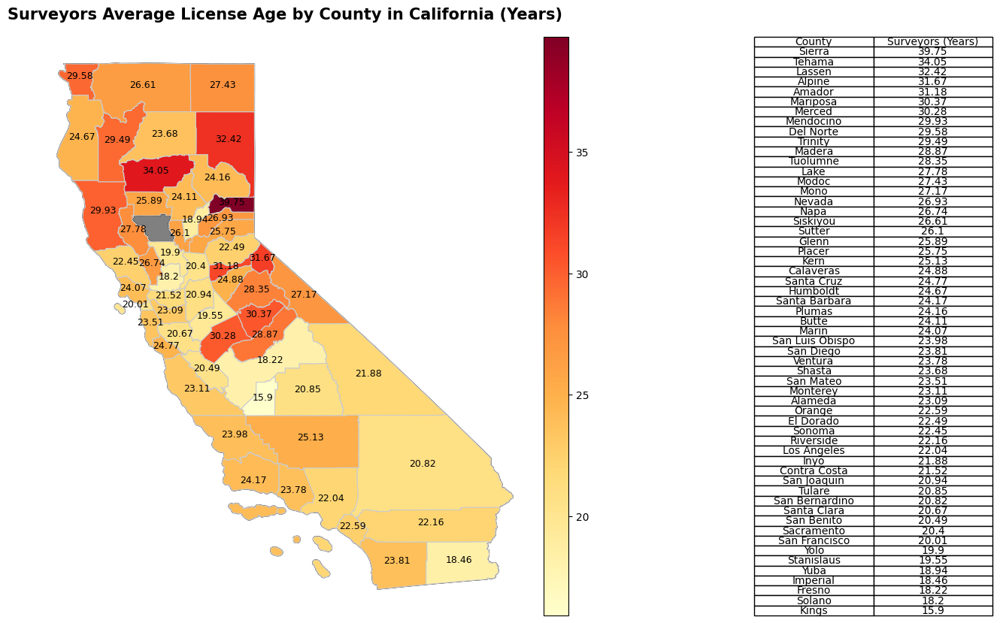

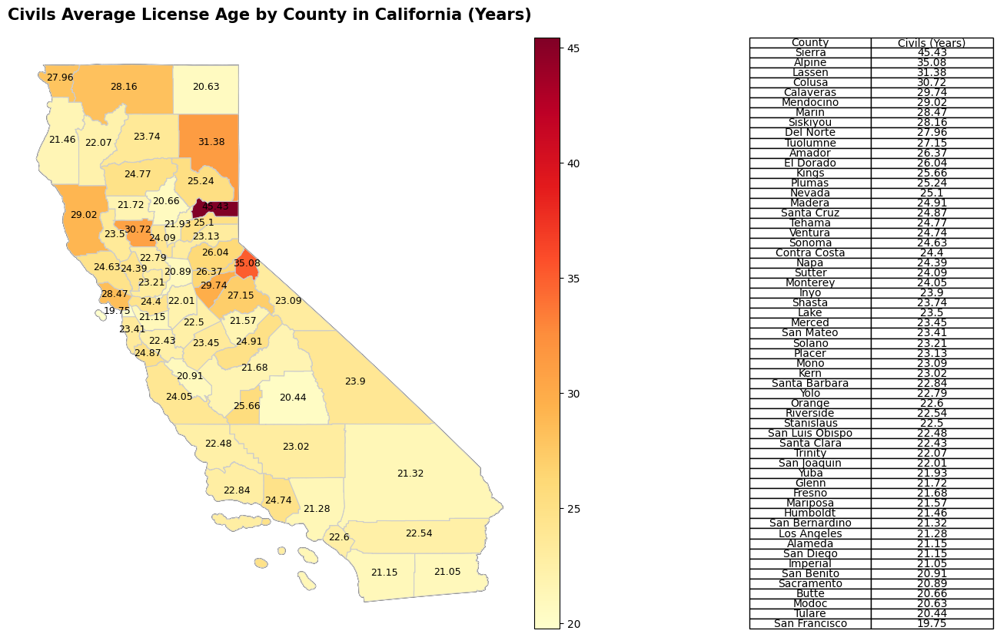

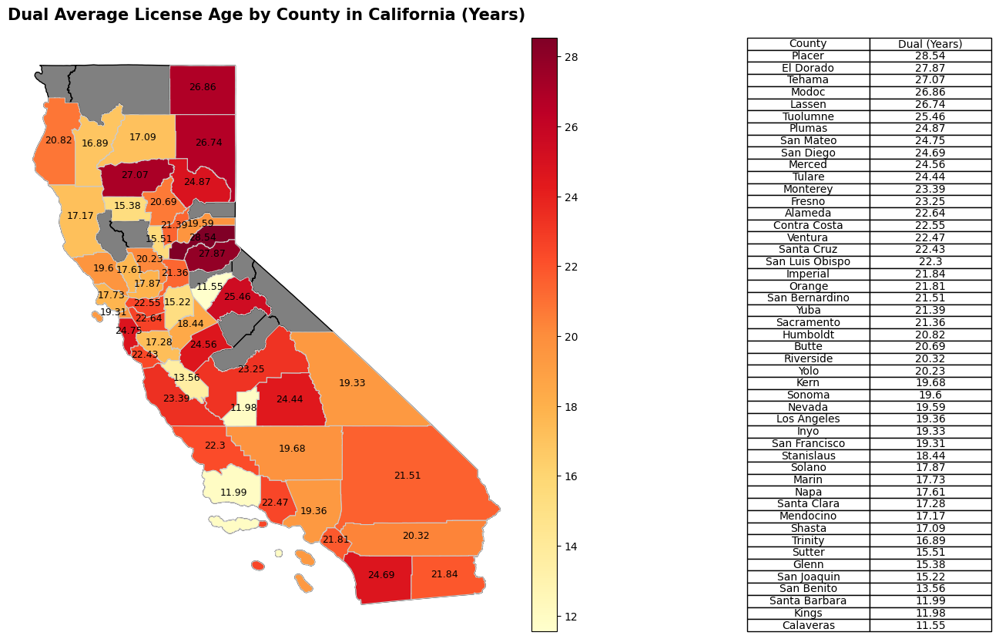

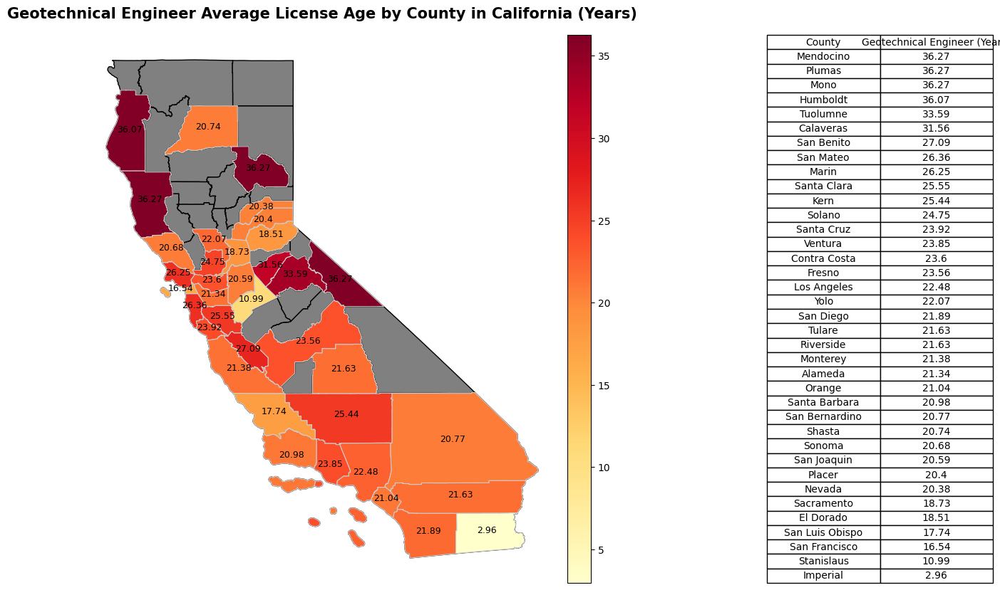

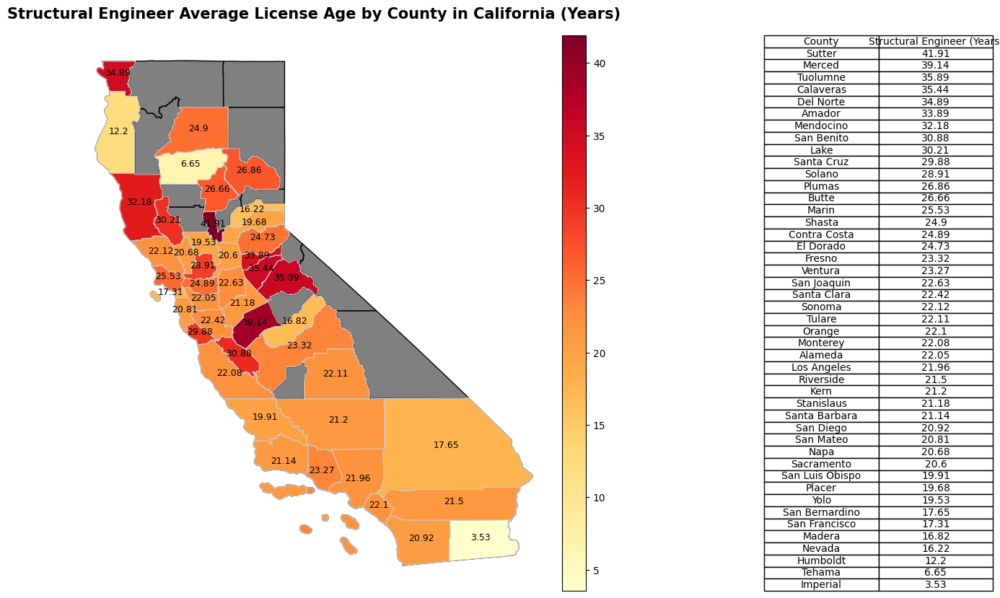

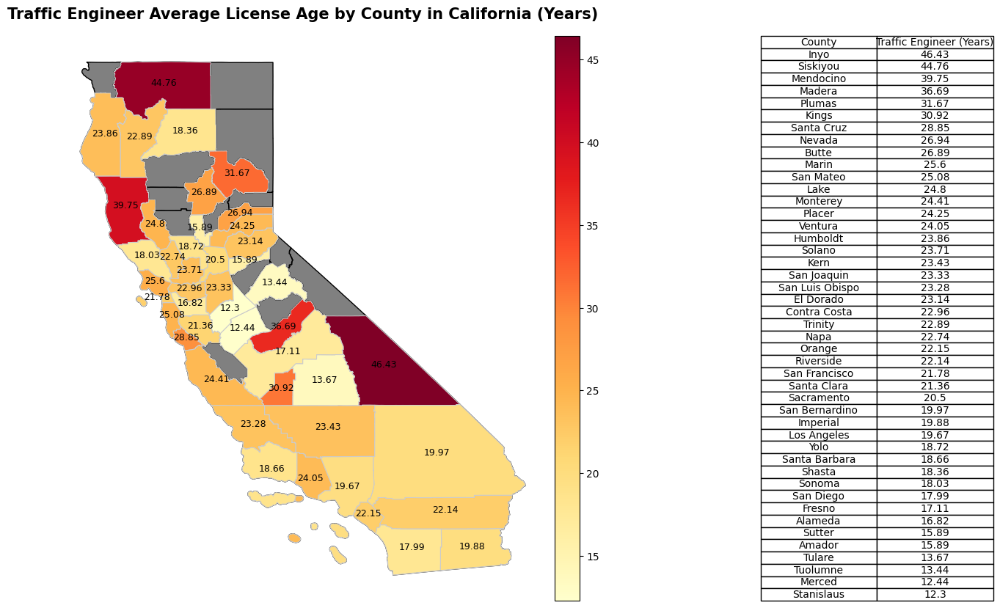

In [28]:
plot_age_map(california_counties_map, ls_average_license_age_by_county, 'Surveyors')
plot_age_map(california_counties_map, civil_average_license_age_by_county, 'Civils')
plot_age_map(california_counties_map, dual_average_license_age_by_county, 'Dual')
plot_age_map(california_counties_map, geo_average_license_age_by_county, 'Geotechnical Engineer')
plot_age_map(california_counties_map, structural_average_license_age_by_county, 'Structural Engineer')
plot_age_map(california_counties_map, traffic_average_license_age_by_county, 'Traffic Engineer')

In [29]:
#NOT USED ANYMORE
# def licenses_issued_per_year(df, date_column='Original Issue Date'):
#     # Convert 'Original Issue Date' to datetime
#     df[date_column] = pd.to_datetime(df[date_column], errors='coerce')

#     # Extract the year from the 'Original Issue Date'
#     df['Year'] = df[date_column].dt.year

#     # Count the occurrences of each year
#     licenses_per_year = df['Year'].value_counts().reset_index()
#     licenses_per_year.columns = ['Year', 'Number of Licenses Issued']

#     # Sort the DataFrame by year
#     licenses_per_year = licenses_per_year.sort_values(by='Year').reset_index(drop=True)

#     return licenses_per_year

## Show Maps of Total Percent of Licences per County
---

In [30]:
def plot_percentages_total_map(counties_map, licenses_df, license_name='Licenses', county_column='County'):
    
    # Calculate total number of surveyors for each county
    pre_merged_data = licenses_df.groupby(county_column).size().reset_index(name=f'Total {license_name}')
    
    # Convert 'County' column to a non-categorical column
    pre_merged_data[county_column] = pre_merged_data[county_column].astype(str)

    # Fill NaN values with 0
    pre_merged_data = pre_merged_data.fillna(0)

    # Convert 'County' column back to a categorical column if needed
    pre_merged_data[county_column] = pre_merged_data[county_column].astype('category')

    # Calculate percentage new surveyors for each county
    pre_merged_data[f'Total percent {license_name}'] = (pre_merged_data[f'Total {license_name}'] / pre_merged_data[f'Total {license_name}'].sum()) * 100

    pre_merged_data = pre_merged_data[[county_column, f'Total percent {license_name}']]

    # Merge GeoDataFrame with DataFrame
    merged_data = pd.merge(counties_map, pre_merged_data, how='left', left_on='NAME', right_on=county_column)

    # Replace NaN values with 0
    merged_data[f'Total percent {license_name}'] = merged_data[f'Total percent {license_name}'].fillna(0).astype(float).round(2)

    # Sort the merged data by the number of licenses issued
    merged_data = merged_data.sort_values(by=f'Total percent {license_name}', ascending=False)

    # Plot the map
    fig, (ax_map, ax_table) = plt.subplots(1, 2, figsize=(16, 8), gridspec_kw={'width_ratios': [3, 1]})

    # Plot the background GeoDataFrame in grayscale
    counties_map.plot(ax=ax_map, color='gray', edgecolor='black')

    # Plot the map
    merged_data.plot(column=f'Total percent {license_name}', cmap='YlOrRd', linewidth=0.8, ax=ax_map, edgecolor='0.8', legend=True)

    # Add colorbar
    cbar = ax_map.get_figure().get_axes()[1]
    cbar.set_ylabel(f'{license_name} Issued', rotation=270, labelpad=15)

    # Add annotations for the number of licenses in each county
# Add annotations for the number of licenses in each county
    for x, y, label in zip(merged_data.geometry.centroid.x, merged_data.geometry.centroid.y, merged_data[f'Total percent {license_name}']):
        ax_map.text(x, y, f'{label}', fontsize=9, ha='center', color='black')


    # Add title to the map
    ax_map.set_title(f'Total percent {license_name} by county', fontdict={'fontsize': '15', 'fontweight': 'bold'})
    ax_map.axis('off')

    # Plot the table
    ax_table.axis('off')  # Turn off axis
    table_data = merged_data[['NAME', f'Total percent {license_name}']].rename(columns={'NAME': 'County'})
    table = ax_table.table(cellText=table_data.values, colLabels=table_data.columns, cellLoc='center', loc='center', bbox=[0, 0, 1, 1])
    table.auto_set_font_size(False)
    table.set_fontsize(10)

    plt.show()

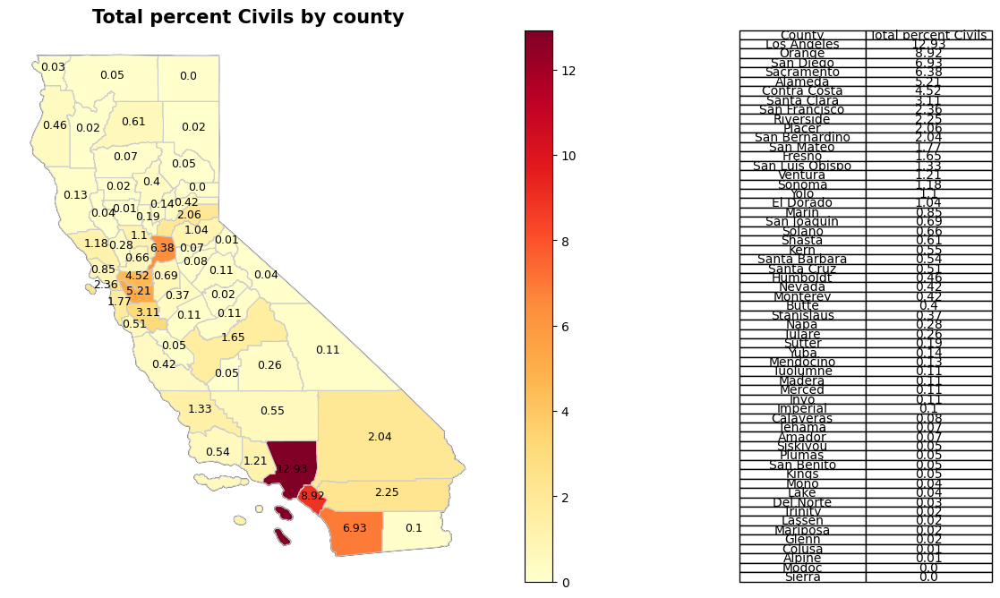

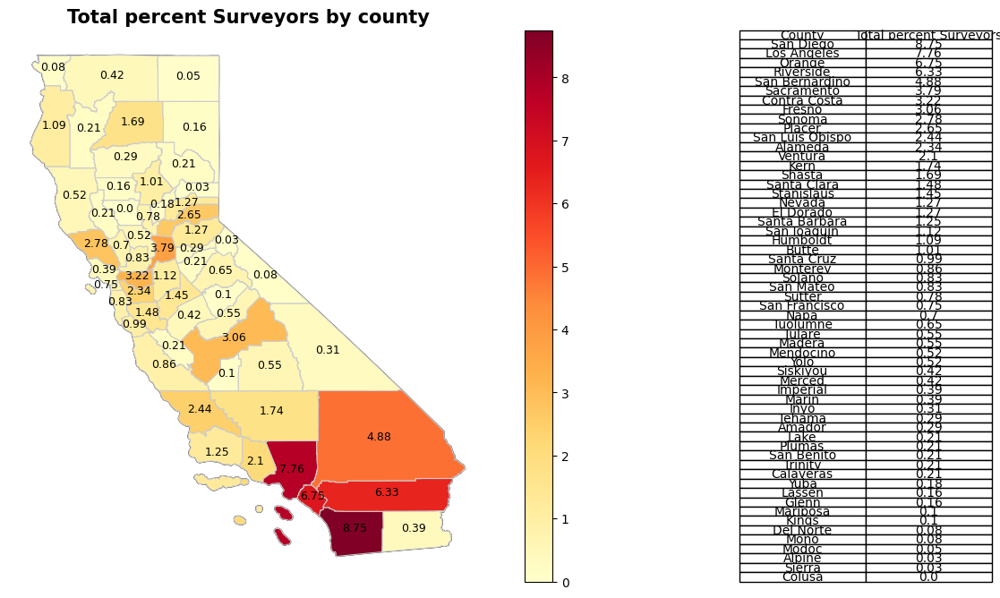

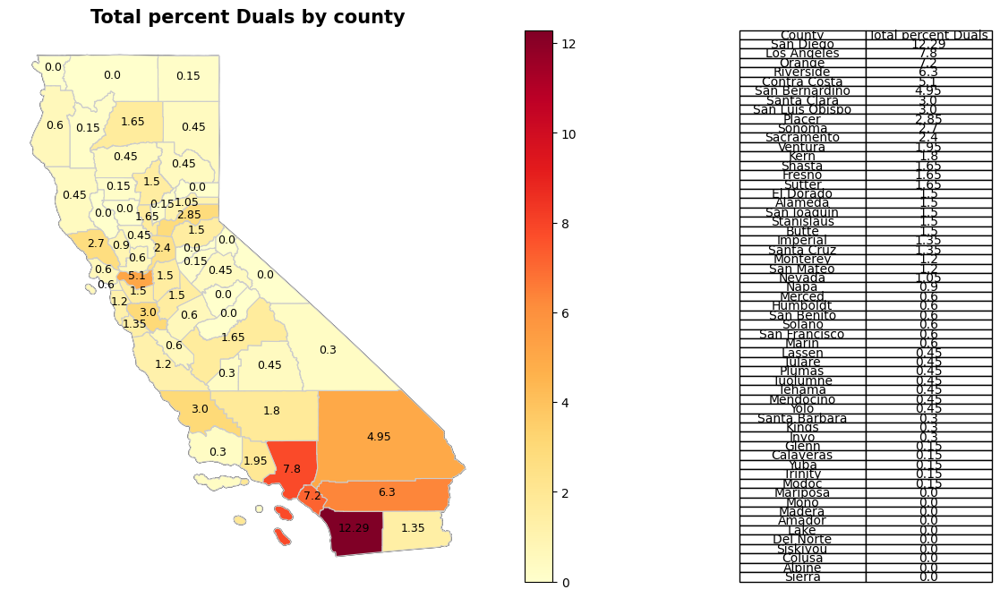

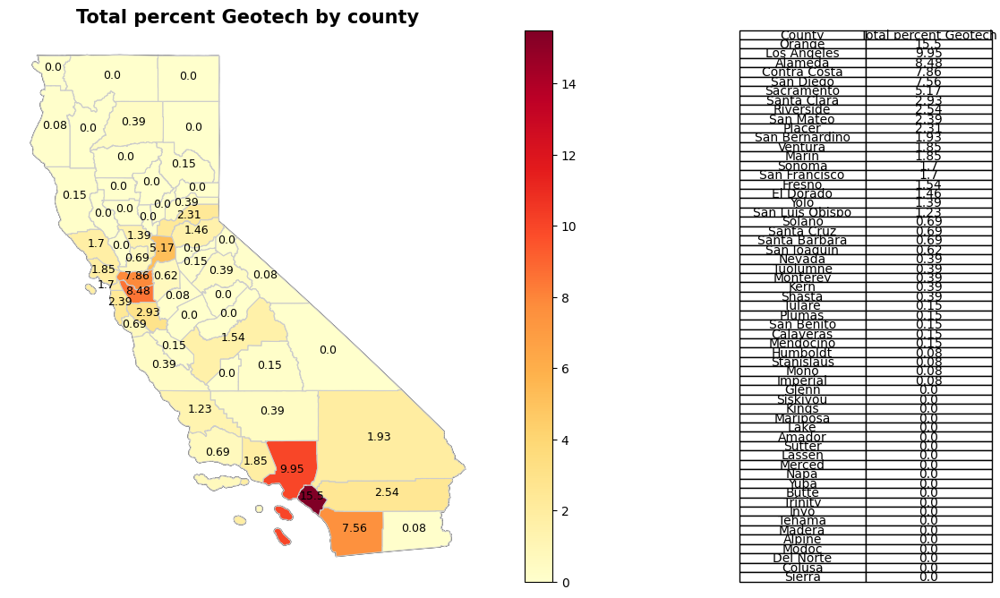

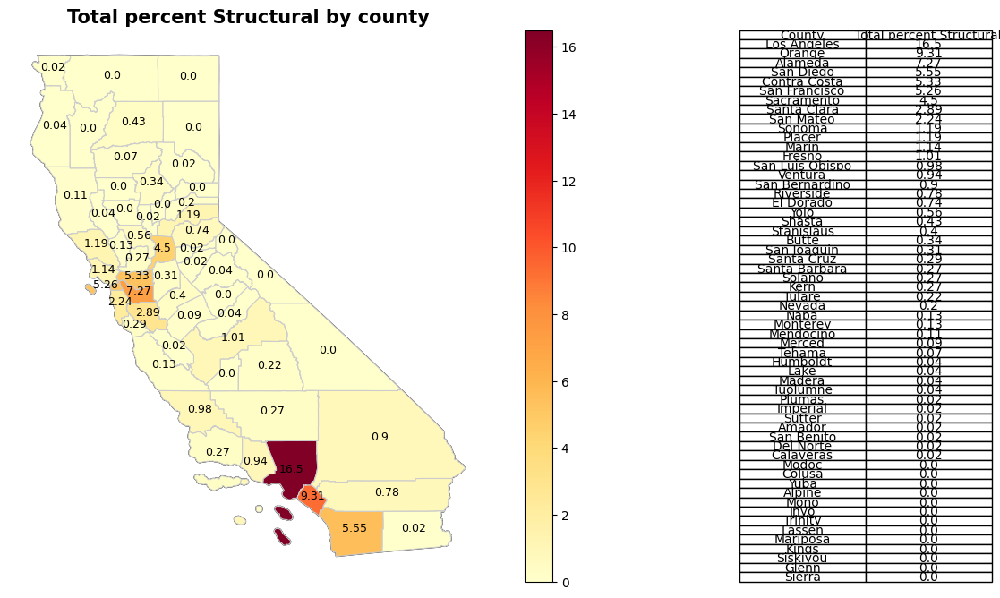

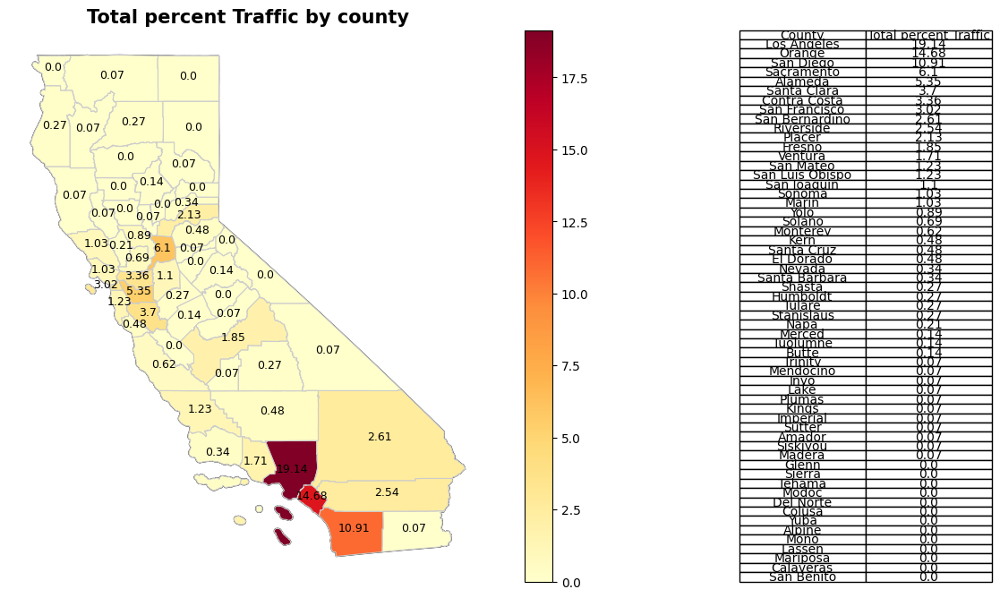

In [31]:
plot_percentages_total_map(california_counties_map, df_raw_civil, license_name="Civils")
plot_percentages_total_map(california_counties_map, df_raw_ls, license_name="Surveyors")
plot_percentages_total_map(california_counties_map, df_dual, license_name="Duals",county_column='County_x')
plot_percentages_total_map(california_counties_map, df_raw_Geo_Engineer, license_name="Geotech")
plot_percentages_total_map(california_counties_map, df_raw_structural, license_name="Structural")
plot_percentages_total_map(california_counties_map, df_raw_Traffic, license_name="Traffic")

## Show Maps of Last Few Years of Issuances
---

In [32]:
def plot_licenses_map_last_n_years(counties_map, licenses_df, n=5, license_name='Licenses' , date_column='Original Issue Date', county_column='County'):
    # Convert 'Original Issue Date' to datetime
    licenses_df[date_column] = pd.to_datetime(licenses_df[date_column], errors='coerce')

    # Filter licenses issued in the last n years
    recent_licenses_df = licenses_df[licenses_df[date_column] >= pd.to_datetime('today') - pd.DateOffset(years=n)]

    # Group by county and count the number of licenses in each county
    licenses_per_county = recent_licenses_df[county_column].value_counts().reset_index()
    licenses_per_county.columns = ['County', f'{license_name} Issued']

    # Merge GeoDataFrame with DataFrame
    merged_data = pd.merge(counties_map, licenses_per_county, how='left', left_on='NAME', right_on='County')

    # Replace NaN values with 0
    merged_data[f'{license_name} Issued'] = merged_data[f'{license_name} Issued'].fillna(0).astype(int)

    # Sort the merged data by the number of licenses issued
    merged_data = merged_data.sort_values(by=f'{license_name} Issued', ascending=False)

    # Plot the map
    fig, (ax_map, ax_table) = plt.subplots(1, 2, figsize=(16, 8), gridspec_kw={'width_ratios': [3, 1]})
        
    # Plot the background GeoDataFrame in grayscale
    counties_map.plot(ax=ax_map, color='gray', edgecolor='black')

    # Plot the map
    merged_data.plot(column=f'{license_name} Issued', cmap='YlOrRd', linewidth=0.8, ax=ax_map, edgecolor='0.8', legend=True)

    # Add colorbar
    cbar = ax_map.get_figure().get_axes()[1]
    cbar.set_ylabel(f'{license_name} Issued', rotation=270, labelpad=15)

    # Add annotations for the number of licenses in each county
    for x, y, label in zip(merged_data.geometry.centroid.x, merged_data.geometry.centroid.y, merged_data[f'{license_name} Issued']):
        ax_map.text(x, y, f'{label}', fontsize=9, ha='center', color='black')

    # Add title to the map
    ax_map.set_title(f'Number of {license_name} Issued in the Last {n} Years by County', fontdict={'fontsize': '15', 'fontweight': 'bold'})
    ax_map.axis('off')

    # Plot the table
    ax_table.axis('off')  # Turn off axis
    table_data = merged_data[['NAME', f'{license_name} Issued']].rename(columns={'NAME': 'County'})
    table = ax_table.table(cellText=table_data.values, colLabels=table_data.columns, cellLoc='center', loc='center', bbox=[0, 0, 1, 1])
    table.auto_set_font_size(False)
    table.set_fontsize(10)

    plt.show()

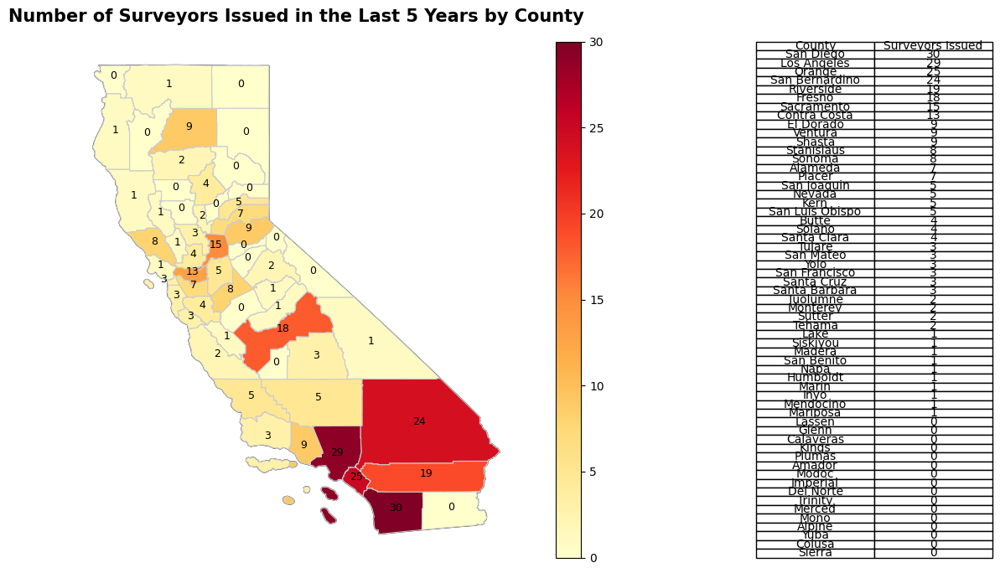

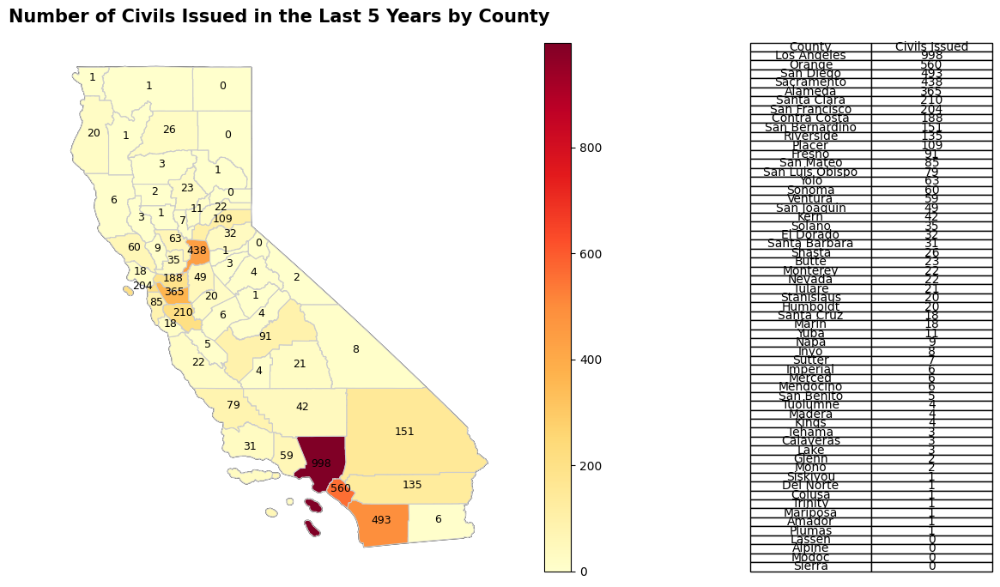

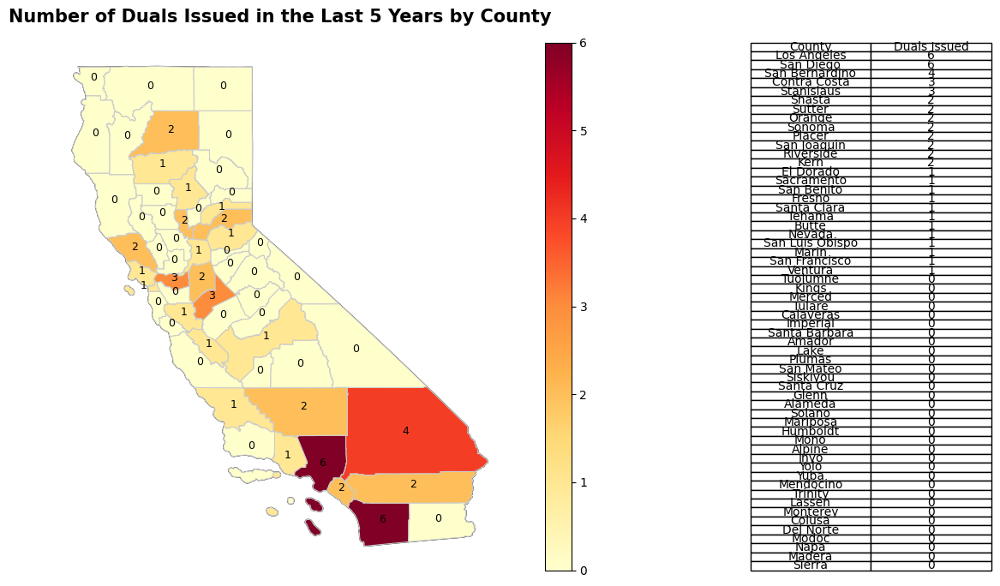

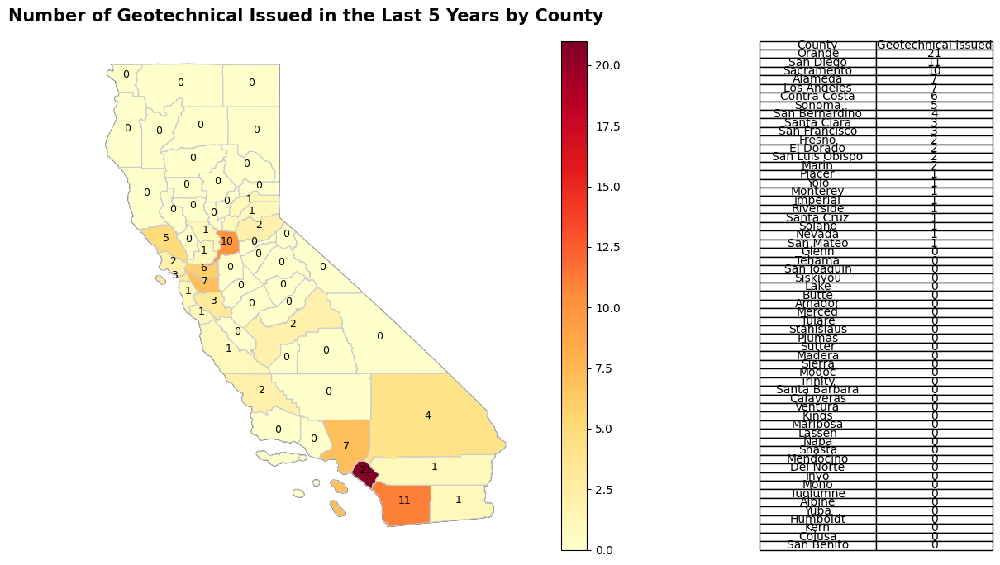

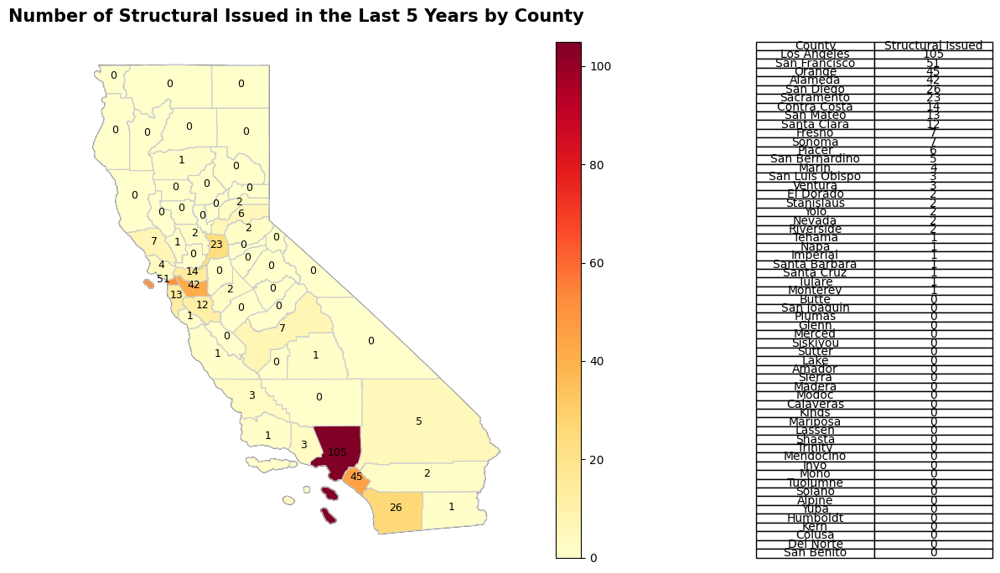

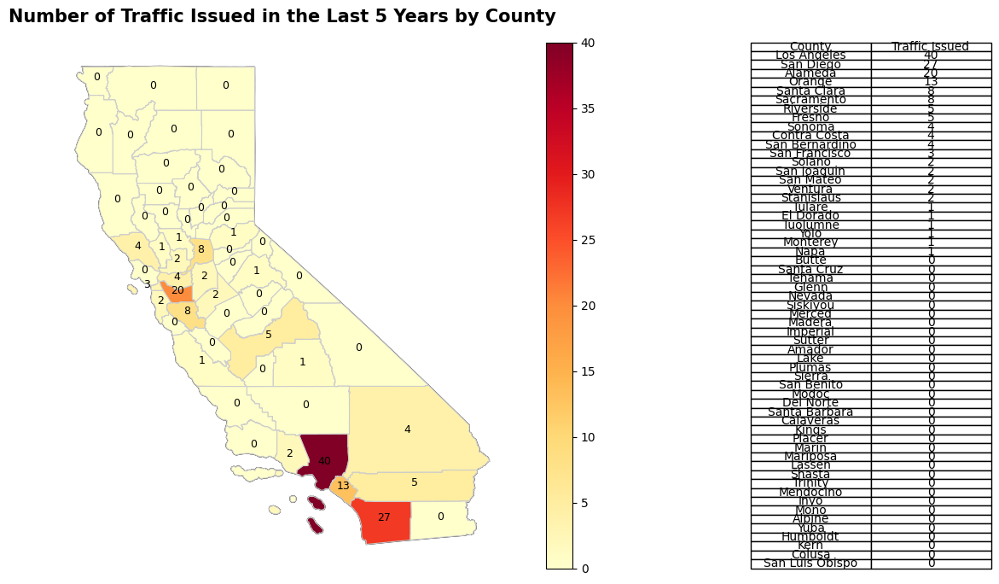

In [33]:
plot_licenses_map_last_n_years(california_counties_map, df_raw_ls, n=5,license_name='Surveyors')
plot_licenses_map_last_n_years(california_counties_map, df_raw_civil, n=5,license_name='Civils')
plot_licenses_map_last_n_years(california_counties_map, df_dual, n=5,license_name='Duals',date_column='Date_of_Dual',county_column='County_x')
plot_licenses_map_last_n_years(california_counties_map, df_raw_Geo_Engineer, n=5,license_name='Geotechnical')
plot_licenses_map_last_n_years(california_counties_map, df_raw_structural, n=5,license_name='Structural')
plot_licenses_map_last_n_years(california_counties_map, df_raw_Traffic, n=5,license_name='Traffic')

## Show Maps of what percent of new licences went to which counties
---

In [34]:
def plot_percentages_growth_map_last_n_years(counties_map, licenses_df, n=5, license_name='Licenses', date_column='Original Issue Date', county_column='County'):
    # Convert 'Original Issue Date' to datetime
    licenses_df[date_column] = pd.to_datetime(licenses_df[date_column], errors='coerce')

    # Filter data for the past n years
    start_date = datetime.now() - timedelta(days=n * 365.25)
    df_n_years = licenses_df[licenses_df[date_column] >= start_date]

    # Calculate total number of new surveyors for each county in the past n years
    pre_merged_data = df_n_years.groupby(county_column).size().reset_index(name=f'Total New {license_name} Last {n} Years')

    # Convert 'County' column to a non-categorical column
    pre_merged_data[county_column] = pre_merged_data[county_column].astype(str)

    # Fill NaN values with 0
    pre_merged_data = pre_merged_data.fillna(0)

    # Convert 'County' column back to a categorical column if needed
    pre_merged_data[county_column] = pre_merged_data[county_column].astype('category')

    # Calculate percentage new surveyors for each county
    pre_merged_data[f'Total percent {license_name} Last {n} Years'] = (pre_merged_data[f'Total New {license_name} Last {n} Years'] / pre_merged_data[f'Total New {license_name} Last {n} Years'].sum()) * 100

    pre_merged_data = pre_merged_data[[county_column, f'Total percent {license_name} Last {n} Years']]

    # Merge GeoDataFrame with DataFrame
    merged_data = pd.merge(counties_map, pre_merged_data, how='left', left_on='NAME', right_on=county_column)

    # Replace NaN values with 0
    merged_data[f'Total percent {license_name} Last {n} Years'] = merged_data[f'Total percent {license_name} Last {n} Years'].fillna(0).astype(float).round(2)

    # Sort the merged data by the number of licenses issued
    merged_data = merged_data.sort_values(by=f'Total percent {license_name} Last {n} Years', ascending=False)

    # Plot the map
    fig, (ax_map, ax_table) = plt.subplots(1, 2, figsize=(16, 8), gridspec_kw={'width_ratios': [3, 1]})

    # Plot the background GeoDataFrame in grayscale
    counties_map.plot(ax=ax_map, color='gray', edgecolor='black')

    # Plot the map
    merged_data.plot(column=f'Total percent {license_name} Last {n} Years', cmap='YlOrRd', linewidth=0.8, ax=ax_map, edgecolor='0.8', legend=True)

    # Add colorbar
    cbar = ax_map.get_figure().get_axes()[1]
    cbar.set_ylabel(f'{license_name} Issued', rotation=270, labelpad=15)

    # Add annotations for the number of licenses in each county
# Add annotations for the number of licenses in each county
    for x, y, label in zip(merged_data.geometry.centroid.x, merged_data.geometry.centroid.y, merged_data[f'Total percent {license_name} Last {n} Years']):
        ax_map.text(x, y, f'{label}', fontsize=9, ha='center', color='black')


    # Add title to the map
    ax_map.set_title(f'Proportional Growth of {license_name} Over Last {n} Years by County', fontdict={'fontsize': '15', 'fontweight': 'bold'})
    ax_map.axis('off')

    # Plot the table
    ax_table.axis('off')  # Turn off axis
    table_data = merged_data[['NAME', f'Total percent {license_name} Last {n} Years']].rename(columns={'NAME': 'County'})
    table = ax_table.table(cellText=table_data.values, colLabels=table_data.columns, cellLoc='center', loc='center', bbox=[0, 0, 1, 1])
    table.auto_set_font_size(False)
    table.set_fontsize(10)

    plt.show()

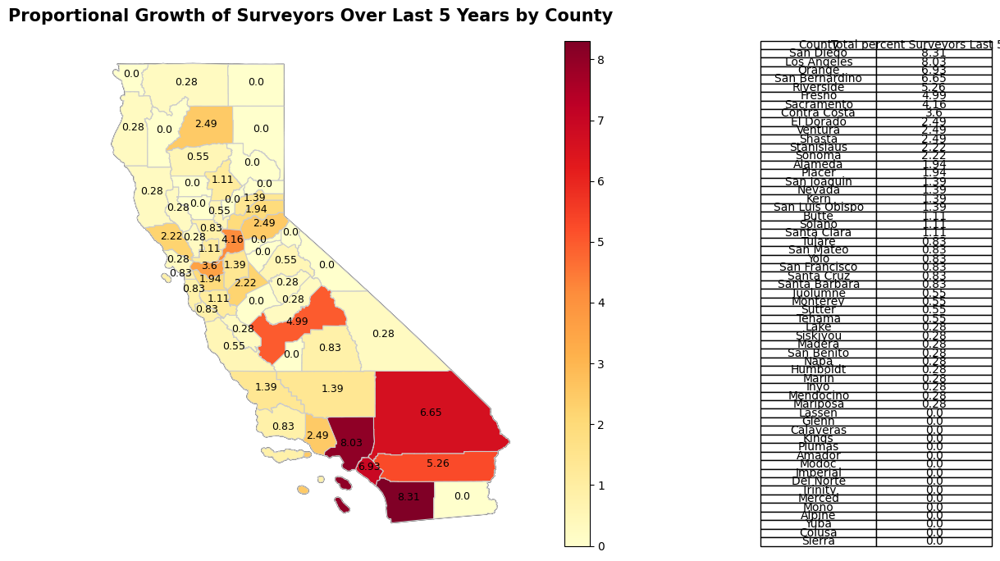

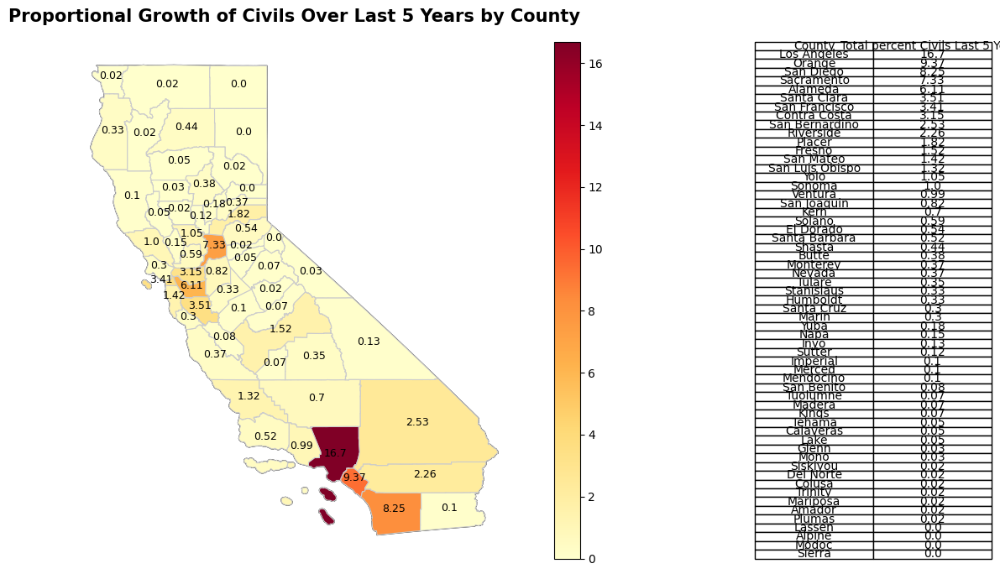

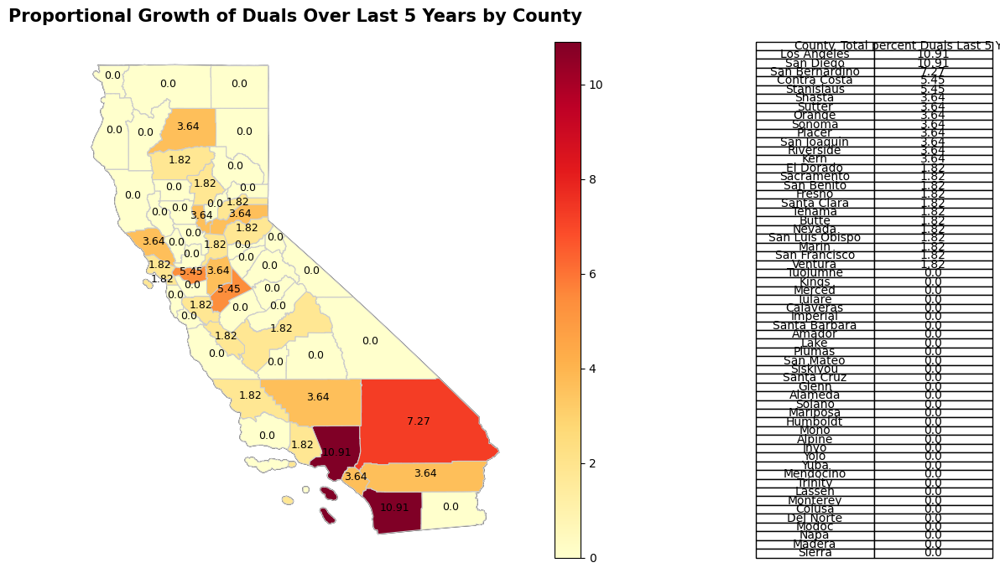

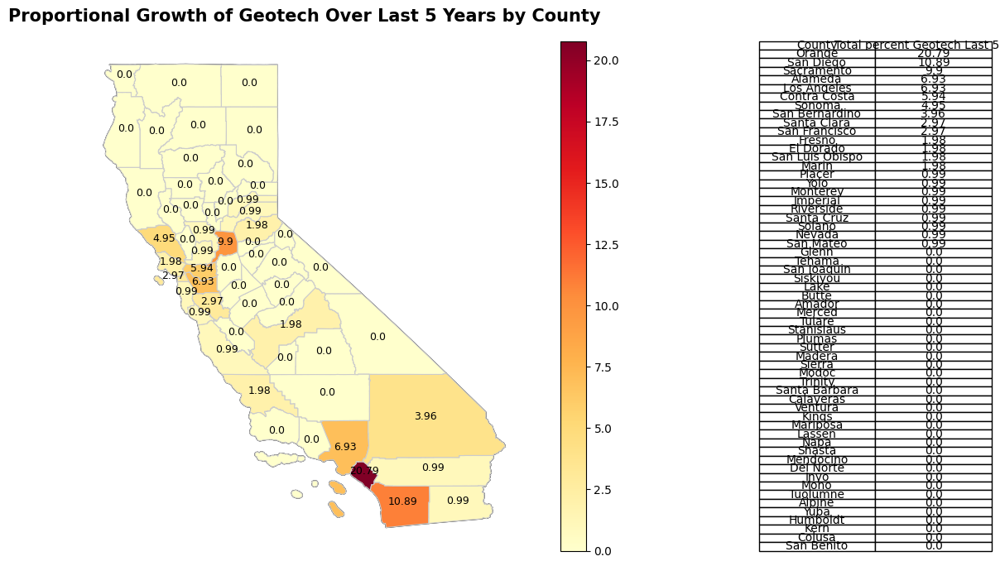

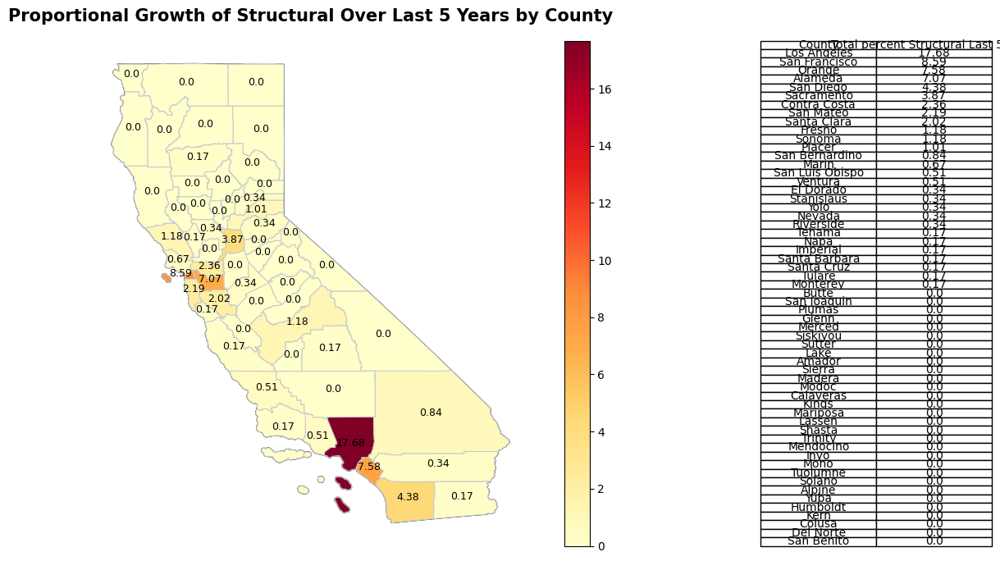

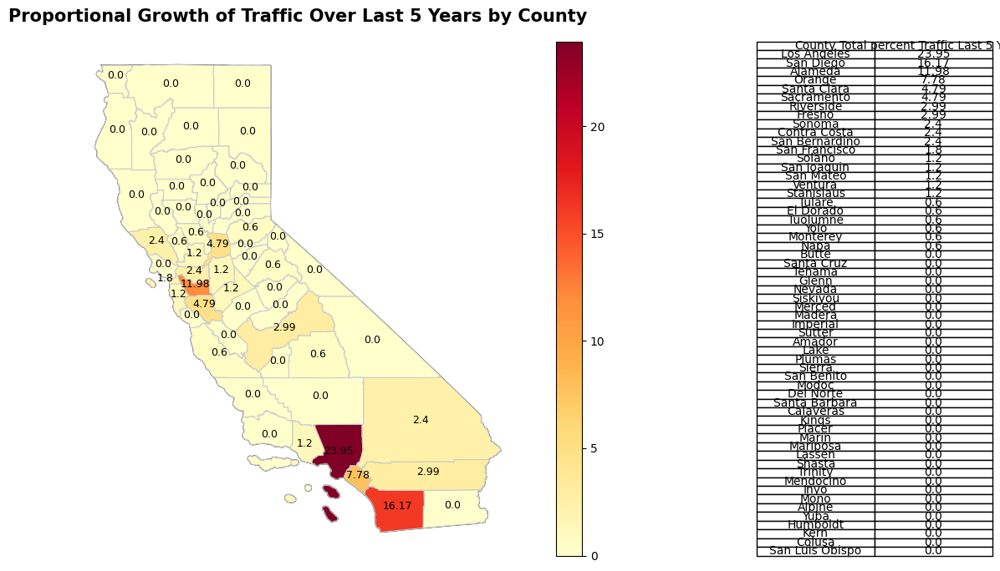

In [35]:
plot_percentages_growth_map_last_n_years(california_counties_map, df_raw_ls, n=5, license_name="Surveyors")
plot_percentages_growth_map_last_n_years(california_counties_map, df_raw_civil, n=5, license_name="Civils")
plot_percentages_growth_map_last_n_years(california_counties_map, df_dual, n=5,date_column='Date_of_Dual' ,county_column='County_x',license_name="Duals")
plot_percentages_growth_map_last_n_years(california_counties_map, df_raw_Geo_Engineer, n=5, license_name="Geotech")
plot_percentages_growth_map_last_n_years(california_counties_map, df_raw_structural, n=5, license_name="Structural")
plot_percentages_growth_map_last_n_years(california_counties_map, df_raw_Traffic, n=5, license_name="Traffic")

## Show Maps of Relative Percentage Growth of Surveyors
---
Percent of Licences Issued the Last N # of years Per County - (minus) Total Percent of Licences per County in CA 


Attempt to show which counties are losing or gaining licences proportional to their total percentage in the state. Where are the counties where there is there growth in each licence type, where are counties that arent replacing their existing licences 

In [36]:
def plot_relative_percentages_map_last_n_years(counties_map, licenses_df, n=5, license_name='Licenses', date_column='Original Issue Date', county_column='County'):
    # Convert 'Original Issue Date' to datetime
    licenses_df[date_column] = pd.to_datetime(licenses_df[date_column], errors='coerce')

    # Filter data for the past n years
    start_date = datetime.now() - timedelta(days=n * 365.25)
    df_n_years = licenses_df[licenses_df[date_column] >= start_date]

    # Calculate total number of surveyors for each county
    total = licenses_df.groupby(county_column).size().reset_index(name=f'Total {license_name}')

    # Calculate total number of new surveyors for each county in the past n years
    total_new = df_n_years.groupby(county_column).size().reset_index(name=f'Total New {license_name} Last {n} Years')

    # Merge total surveyors and total new surveyors on the county column
    pre_merged_data = pd.merge(total, total_new, on=county_column, how='left')

    # Convert 'County' column to a non-categorical column
    pre_merged_data[county_column] = pre_merged_data[county_column].astype(str)

    # Fill NaN values with 0
    pre_merged_data = pre_merged_data.fillna(0)

    # Convert 'County' column back to a categorical column if needed
    pre_merged_data[county_column] = pre_merged_data[county_column].astype('category')

    # Calculate percentage new surveyors for each county
    pre_merged_data[f'Total percent {license_name}'] = (pre_merged_data[f'Total {license_name}'] / pre_merged_data[f'Total {license_name}'].sum()) * 100
    pre_merged_data[f'Total percent {license_name} Last {n} Years'] = (pre_merged_data[f'Total New {license_name} Last {n} Years'] / pre_merged_data[f'Total New {license_name} Last {n} Years'].sum()) * 100
    pre_merged_data['Percentage Difference'] = (pre_merged_data[f'Total percent {license_name} Last {n} Years'] - pre_merged_data[f'Total percent {license_name}'])

    pre_merged_data = pre_merged_data[[county_column,
                               f'Total percent {license_name}', f'Total percent {license_name} Last {n} Years',
                               'Percentage Difference']]

    # Merge GeoDataFrame with DataFrame
    merged_data = pd.merge(counties_map, pre_merged_data, how='left', left_on='NAME', right_on=county_column)

    # Replace NaN values with 0
    merged_data['Percentage Difference'] = merged_data['Percentage Difference'].fillna(0).astype(float).round(2)

    # Sort the merged data by the number of licenses issued
    merged_data = merged_data.sort_values(by='Percentage Difference', ascending=False)

    # Plot the map
    fig, (ax_map, ax_table) = plt.subplots(1, 2, figsize=(16, 8), gridspec_kw={'width_ratios': [3, 1]})

    # Plot the background GeoDataFrame in grayscale
    counties_map.plot(ax=ax_map, color='gray', edgecolor='black')

    # Plot the map
    merged_data.plot(column='Percentage Difference', cmap='YlOrRd', linewidth=0.8, ax=ax_map, edgecolor='0.8', legend=True)

    # Add colorbar
    cbar = ax_map.get_figure().get_axes()[1]
    cbar.set_ylabel(f'{license_name} Issued', rotation=270, labelpad=15)

    # Add annotations for the number of licenses in each county
# Add annotations for the number of licenses in each county
    for x, y, label in zip(merged_data.geometry.centroid.x, merged_data.geometry.centroid.y, merged_data['Percentage Difference']):
        ax_map.text(x, y, f'{label}', fontsize=9, ha='center', color='black')


    # Add title to the map
    ax_map.set_title(f'Reltative Growth of {license_name} Over Last {n} Years by County', fontdict={'fontsize': '15', 'fontweight': 'bold'})
    ax_map.axis('off')

    # Plot the table
    ax_table.axis('off')  # Turn off axis
    table_data = merged_data[['NAME', 'Percentage Difference']].rename(columns={'NAME': 'County'})
    table = ax_table.table(cellText=table_data.values, colLabels=table_data.columns, cellLoc='center', loc='center', bbox=[0, 0, 1, 1])
    table.auto_set_font_size(False)
    table.set_fontsize(10)

    plt.show()

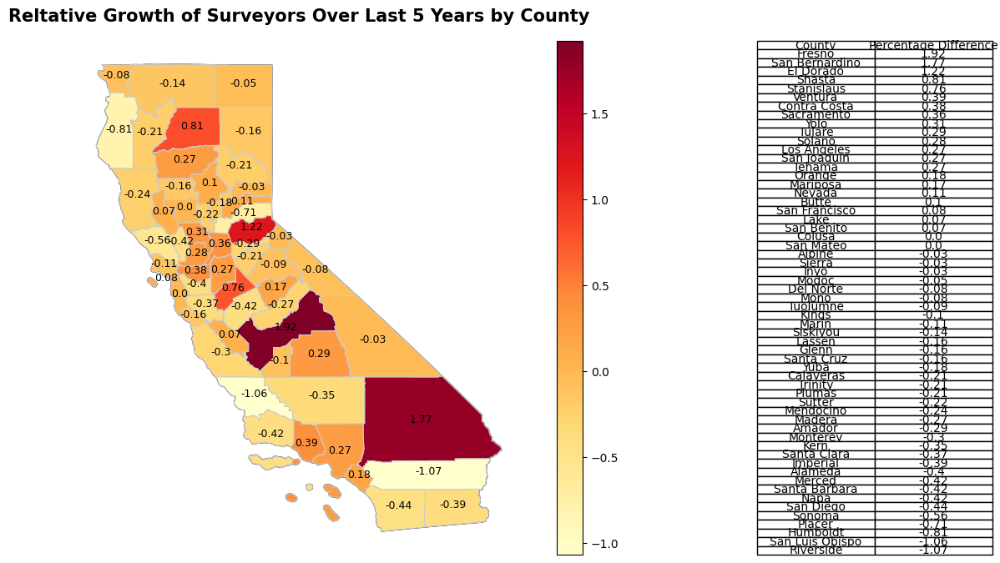

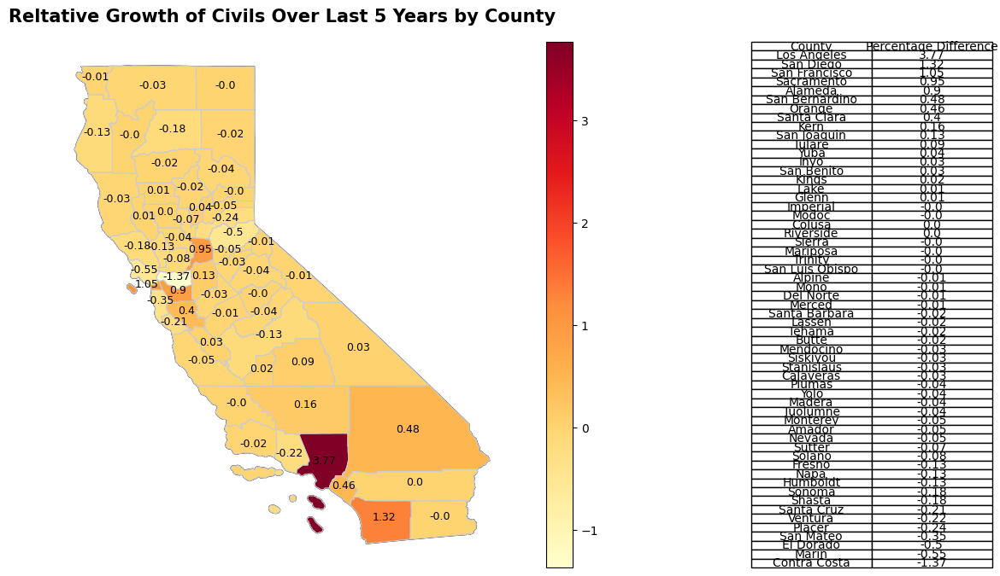

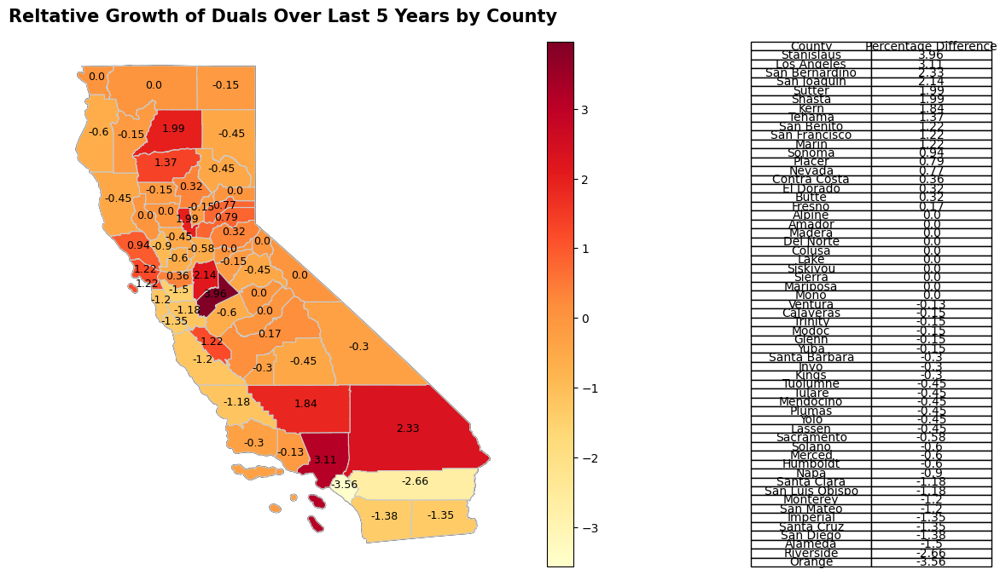

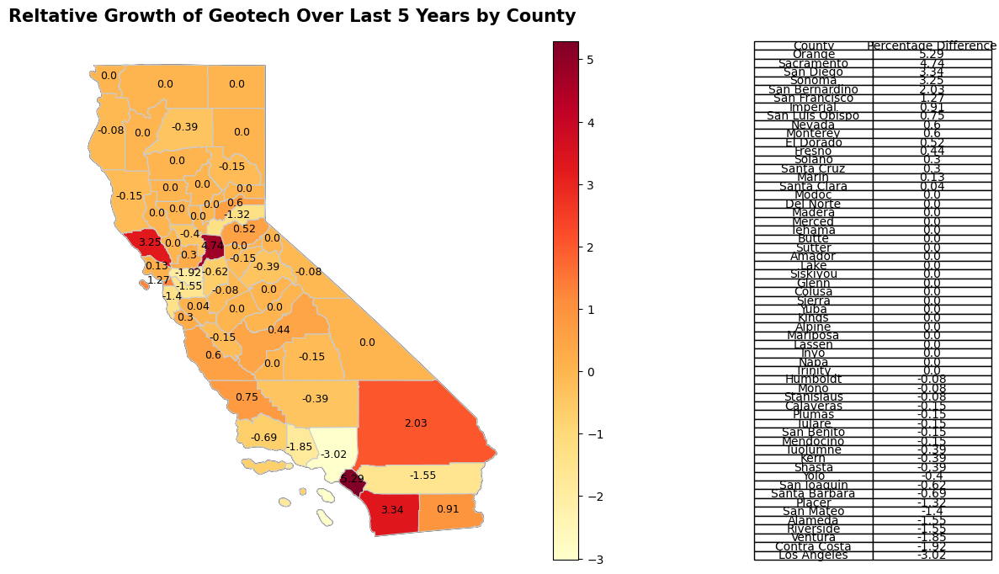

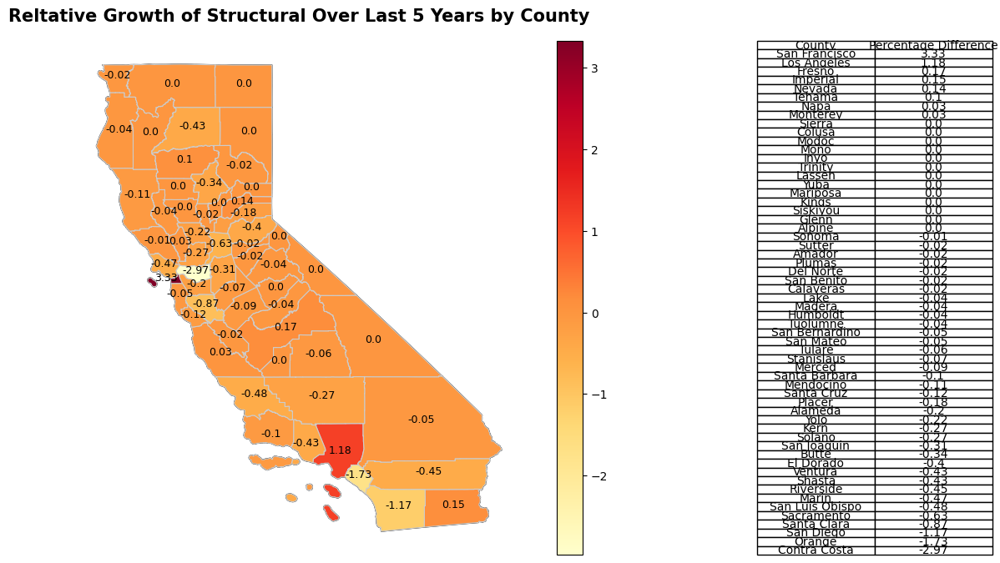

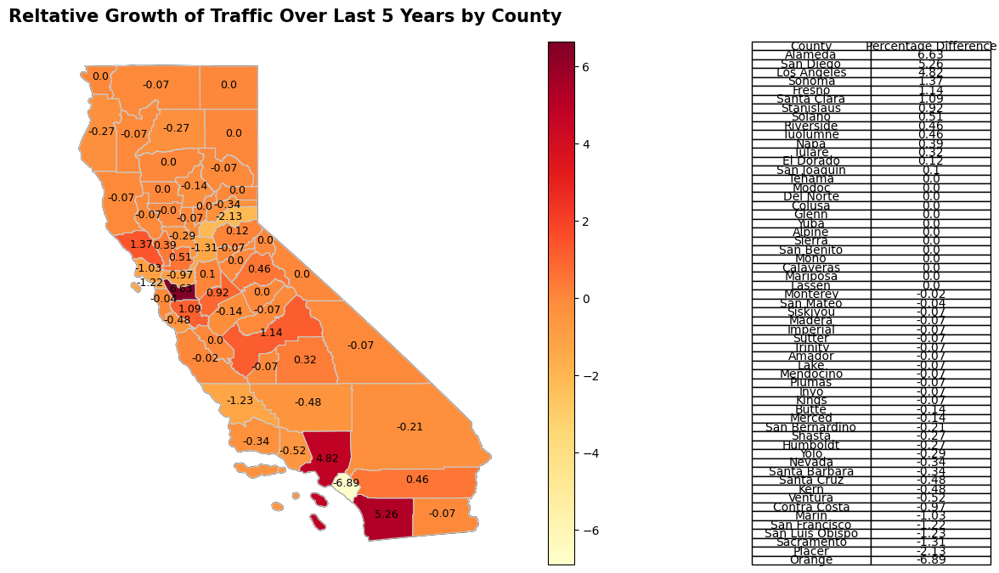

In [37]:
#plot 
plot_relative_percentages_map_last_n_years(california_counties_map, df_raw_ls, n=5, license_name="Surveyors")
plot_relative_percentages_map_last_n_years(california_counties_map, df_raw_civil, n=5, license_name="Civils")
plot_relative_percentages_map_last_n_years(california_counties_map, df_dual, n=5,date_column='Date_of_Dual' ,county_column='County_x',license_name="Duals")
plot_relative_percentages_map_last_n_years(california_counties_map, df_raw_Geo_Engineer, n=5, license_name="Geotech")
plot_relative_percentages_map_last_n_years(california_counties_map, df_raw_structural, n=5, license_name="Structural")
plot_relative_percentages_map_last_n_years(california_counties_map, df_raw_Traffic, n=5, license_name="Traffic")

## Population Comparision to Licences based on Census Data
---

In [38]:
#load in census data
df_population = pd.read_csv('co-est2022-pop-06.csv')

In [39]:
def plot_population_percentages_total_map(counties_map, licenses_df, df_population, Population_column = '2020Base', license_name='Licenses', county_column='County', county_column_pop='County'):
    
    # Calculate total number of surveyors for each county
    total = licenses_df.groupby(county_column).size().reset_index(name=f'Total {license_name}')
    
    # Merge total surveyors and population on the county column
    pre_merged_data = pd.merge(total, df_population, how='left', left_on=county_column, right_on=county_column_pop)

    # Convert 'County' column to a non-categorical column
    pre_merged_data[county_column] = pre_merged_data[county_column].astype(str)

    # Fill NaN values with 0
    pre_merged_data = pre_merged_data.fillna(0)

    # Convert 'County' column back to a categorical column if needed
    pre_merged_data[county_column] = pre_merged_data[county_column].astype('category')
    
    # Calculate percentage new surveyors for each county
    pre_merged_data[f'Total percent {license_name}'] = (pre_merged_data[f'Total {license_name}'] / pre_merged_data[Population_column]) *1000

    pre_merged_data = pre_merged_data[[county_column, f'Total percent {license_name}']]

    # Merge GeoDataFrame with DataFrame
    merged_data = pd.merge(counties_map, pre_merged_data, how='left', left_on='NAME', right_on=county_column)

    # Replace NaN values with 0
    merged_data[f'Total percent {license_name}'] = merged_data[f'Total percent {license_name}'].fillna(0).astype(float).round(3)

    # Sort the merged data by the number of licenses issued
    merged_data = merged_data.sort_values(by=f'Total percent {license_name}', ascending=False)

    # Plot the map
    fig, (ax_map, ax_table) = plt.subplots(1, 2, figsize=(16, 8), gridspec_kw={'width_ratios': [3, 1]})

    # Plot the background GeoDataFrame in grayscale
    counties_map.plot(ax=ax_map, color='gray', edgecolor='black')

    # Plot the map
    merged_data.plot(column=f'Total percent {license_name}', cmap='YlOrRd', linewidth=0.8, ax=ax_map, edgecolor='0.8', legend=True)

    # Add colorbar
    cbar = ax_map.get_figure().get_axes()[1]
    cbar.set_ylabel(f'{license_name} Issued', rotation=270, labelpad=15)

    # Add annotations for the number of licenses in each county
    for x, y, label in zip(merged_data.geometry.centroid.x, merged_data.geometry.centroid.y, merged_data[f'Total percent {license_name}']):
        ax_map.text(x, y, f'{label}', fontsize=9, ha='center', color='black')


    # Add title to the map
    ax_map.set_title(f'Total percent {license_name} of population by county {Population_column} (10th of a percent divide by 10 for actual percent)', fontdict={'fontsize': '15', 'fontweight': 'bold'})
    ax_map.axis('off')

    # Plot the table
    ax_table.axis('off')  # Turn off axis
    table_data = merged_data[['NAME', f'Total percent {license_name}']].rename(columns={'NAME': 'County'})
    table_data[f'{license_name}/population'] = 1 / (table_data[f'Total percent {license_name}']/1000)
    table_data[f'Total percent {license_name}'] = table_data[f'Total percent {license_name}']/10
    table_data[f'Total percent {license_name}'] = table_data[f'Total percent {license_name}'].round(3)
    table_data[f'{license_name}/population'] = table_data[f'{license_name}/population'].round(2)
    table = ax_table.table(cellText=table_data.values, colLabels=table_data.columns, cellLoc='center', loc='center', bbox=[0, 0, 2, 1])
    table.auto_set_font_size(False)
    table.set_fontsize(10)

    plt.show()

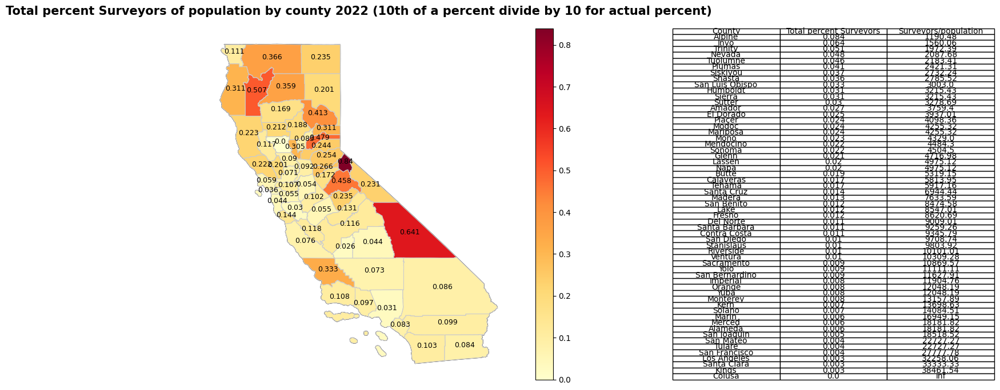

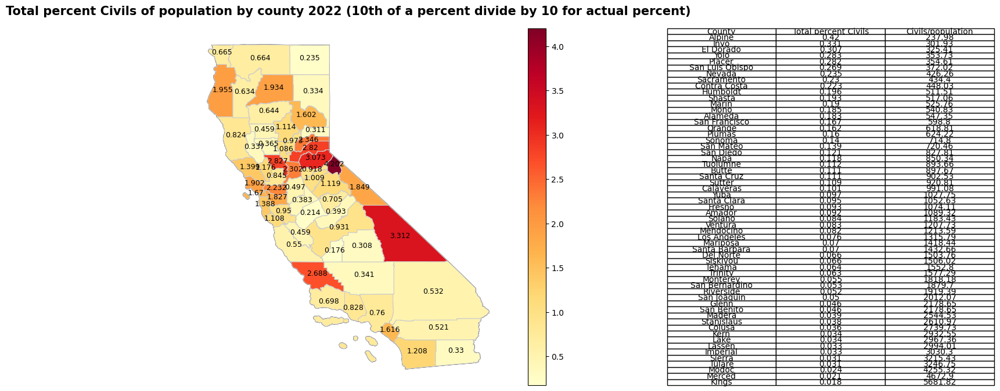

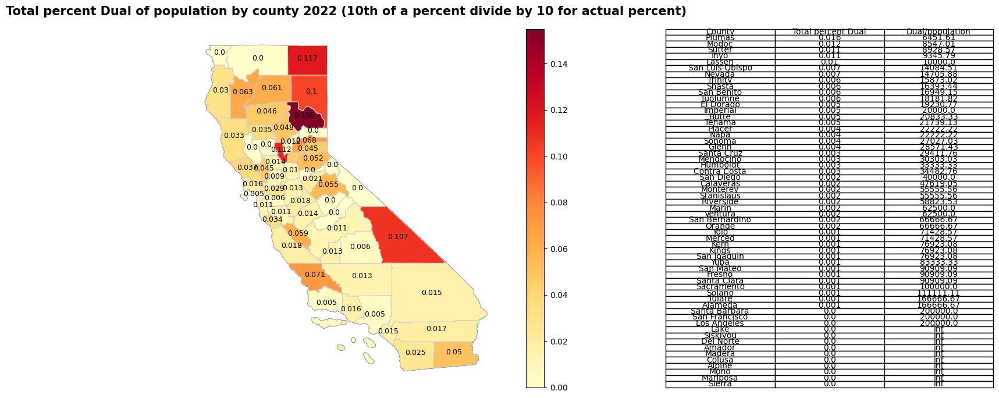

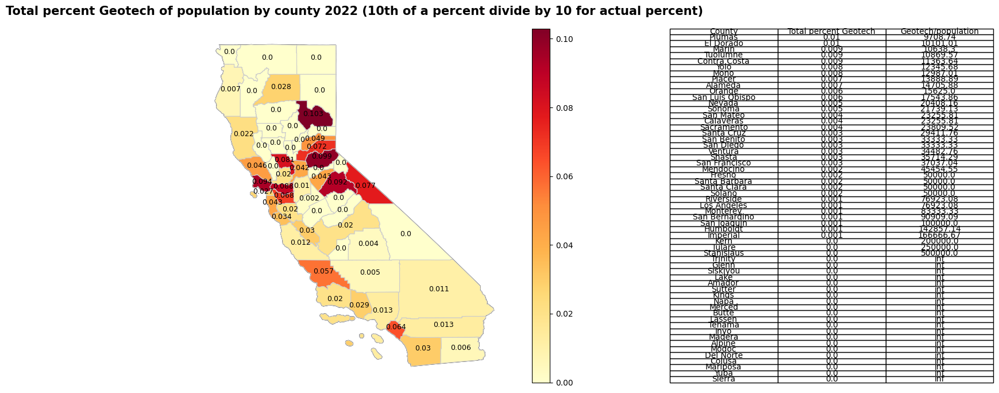

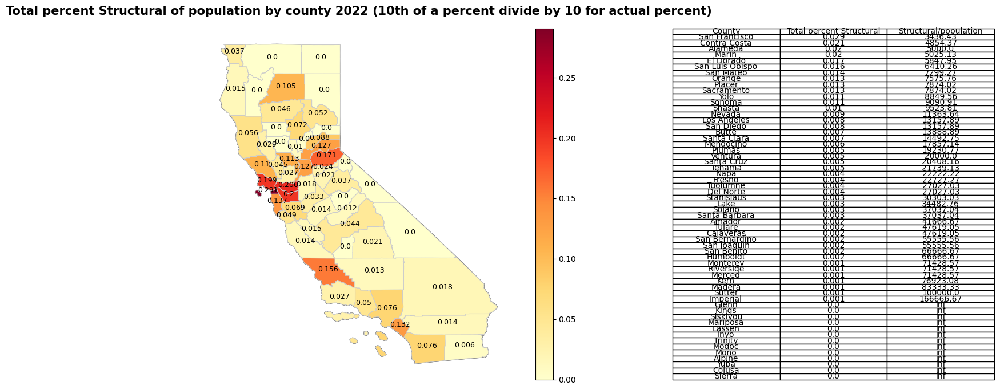

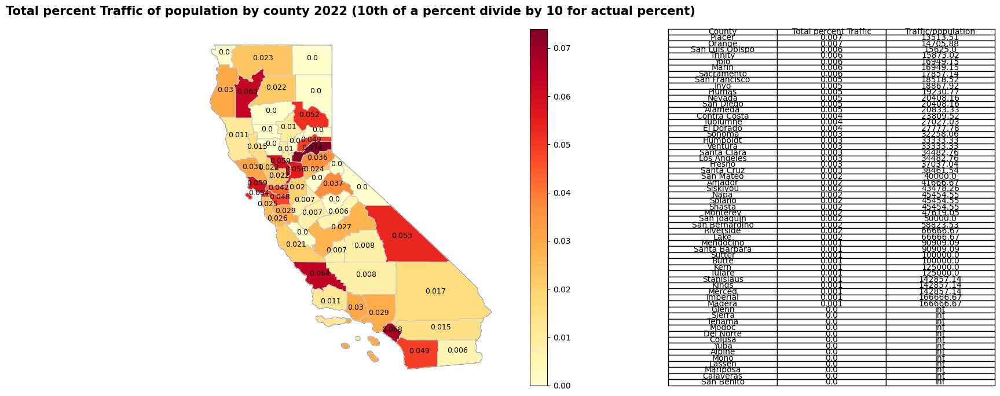

In [40]:
#plot maps using 2022 census projections
plot_population_percentages_total_map(california_counties_map, df_raw_ls, df_population, Population_column='2022', license_name="Surveyors")
plot_population_percentages_total_map(california_counties_map, df_raw_civil, df_population, Population_column='2022', license_name="Civils")
plot_population_percentages_total_map(california_counties_map, df_dual, df_population, Population_column='2022', license_name="Dual", county_column='County_x')
plot_population_percentages_total_map(california_counties_map, df_raw_Geo_Engineer, df_population, Population_column='2022', license_name="Geotech")
plot_population_percentages_total_map(california_counties_map, df_raw_structural, df_population, Population_column='2022', license_name="Structural")
plot_population_percentages_total_map(california_counties_map, df_raw_Traffic, df_population, Population_column='2022', license_name="Traffic")